In [1]:
import torch
import numpy as np 
import matplotlib.pyplot as plt 
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import pandas as pd

from kan import create_dataset, KAN, KANLayer
from kan.MLP import MLP

from sklearn.metrics import root_mean_squared_error, mean_absolute_error, r2_score
import shap


from source import plot_f_2d, plot_f_3d, scatter_prediction_kan, kan_summary_after_fit
from source import lmdKAN, tlmdKAN, importance_analyse_lmdKAN, importance_analyse_tlmdKAN


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

c:\Users\Gavriil\VS_projects\lambda_KAN\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cpu


-----
-----
## $f_3(x_1, x_2)$

##### $f_3(x_1, x_2) = (\exp({a1} \cdot x_1) + \exp({a2} \cdot x_2) + {b1} \cdot \cos(\pi / 2 * x_1) + {b2} \cdot \cos(\pi / 2 * x_2) - 5) / 5$

c:\Users\Gavriil\VS_projects\lambda_KAN\.venv\lib\site-packages\torch\functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\TensorShape.cpp:4316.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


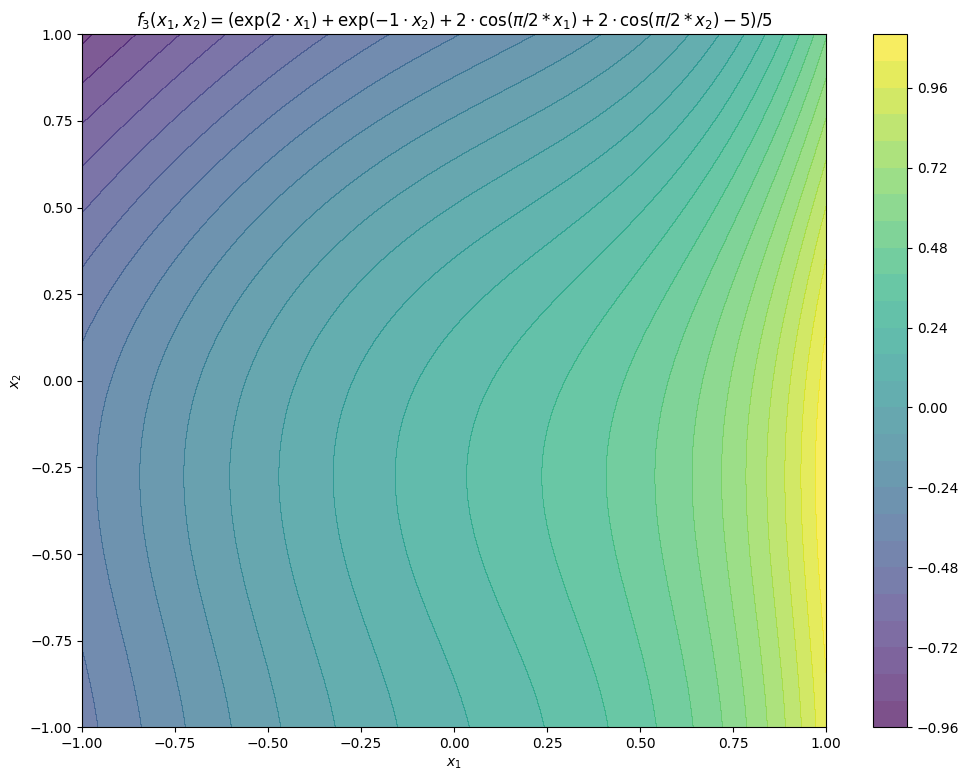

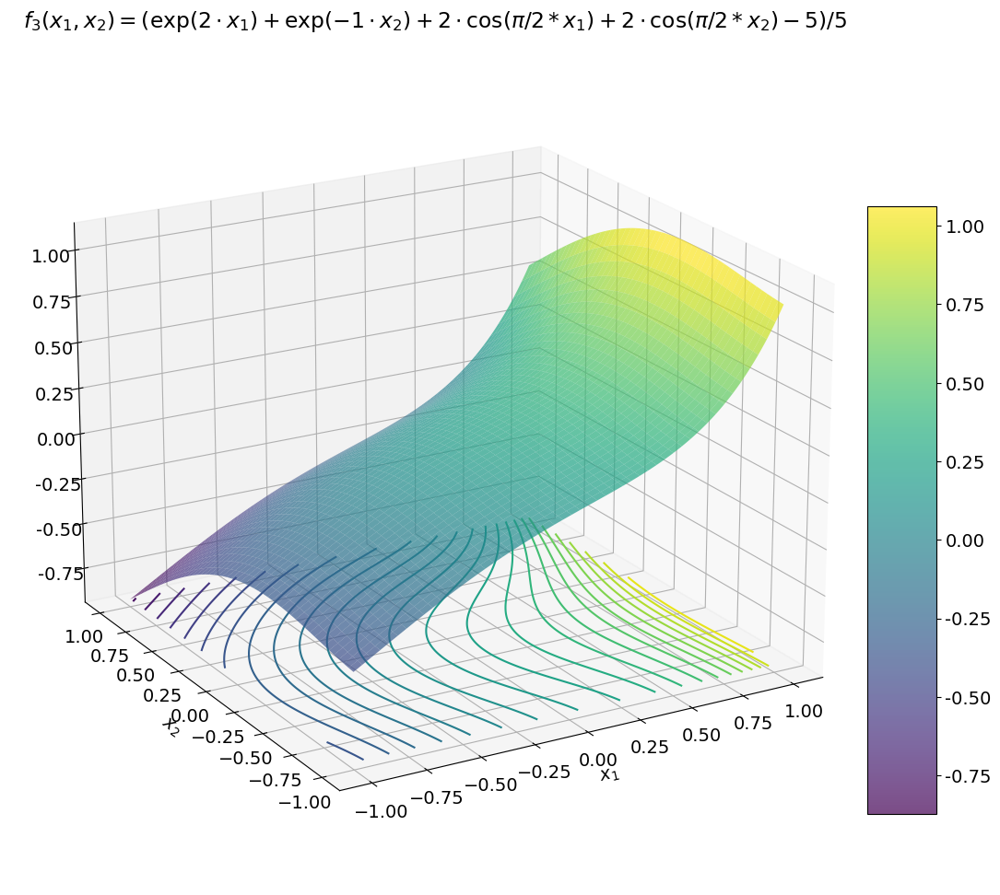

In [2]:
# create dataset
a1, a2, b1, b2 = 2, -1, 2, 2
f3 = lambda x: (torch.exp(a1*x[:,[0]]) + torch.exp(a2*x[:,[1]]) + b1*torch.cos(torch.pi/2*x[:,[0]]) + b2*torch.cos(torch.pi/2*x[:,[1]]) -5 ) / 5
dataset3 = create_dataset(f3, n_var=2, device=device)

f = f3
dataset = dataset3

plot_f_2d(f3, title=f'$f_3(x_1, x_2) = (\exp({a1} \cdot x_1) + \exp({a2} \cdot x_2) + {b1} \cdot \cos(\pi / 2 * x_1) + {b2} \cdot \cos(\pi / 2 * x_2) - 5) / 5$')
plot_f_3d(f3, title=f'$f_3(x_1, x_2) = (\exp({a1} \cdot x_1) + \exp({a2} \cdot x_2) + {b1} \cdot \cos(\pi / 2 * x_1) + {b2} \cdot \cos(\pi / 2 * x_2) - 5) / 5$')

-----
### MLP on $f_3$

№ model trainable params: 216


| train_loss: 1.63e-03 | test_loss: 1.48e-03 | reg: 6.87e+01 | : 100%|█| 100/100 [00:33<00:00,  2.97


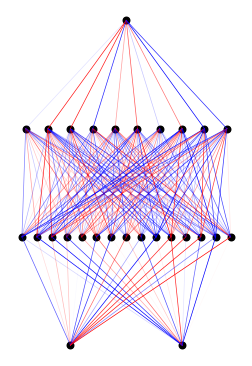

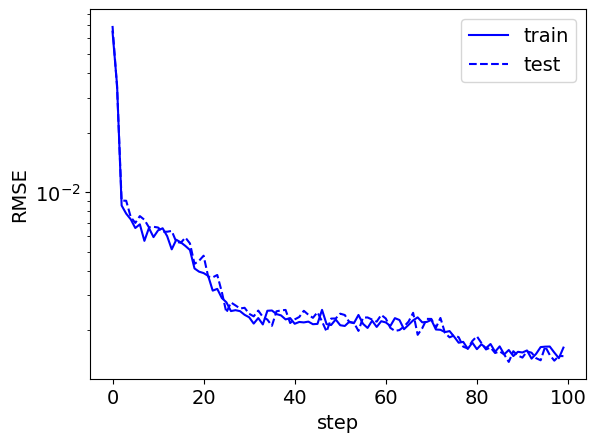

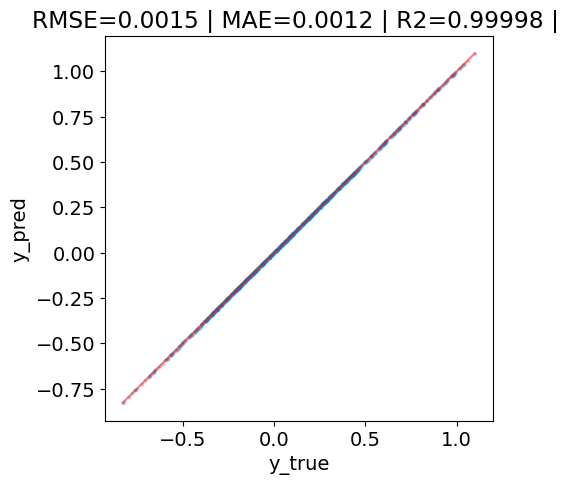

In [3]:
# initialize MLP
model = MLP(width=[2,15,10,1], seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=100, lamb = 0, batch=250)
kan_summary_after_fit(model, dataset, results)

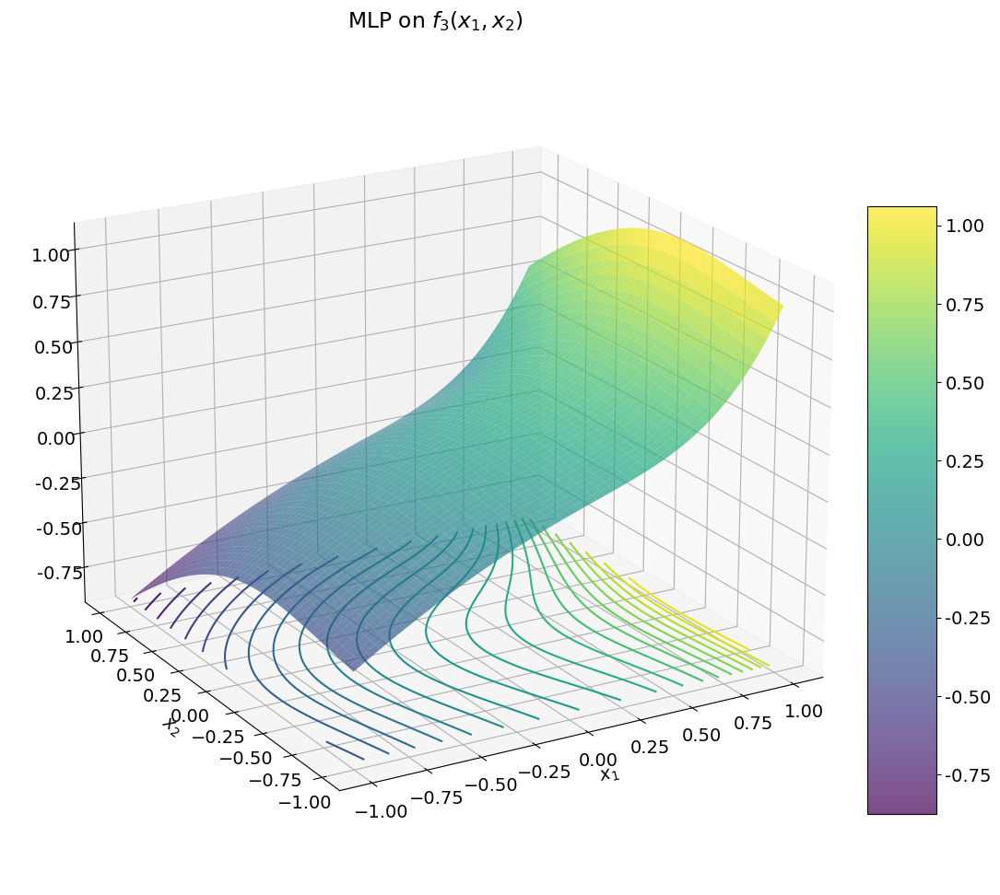

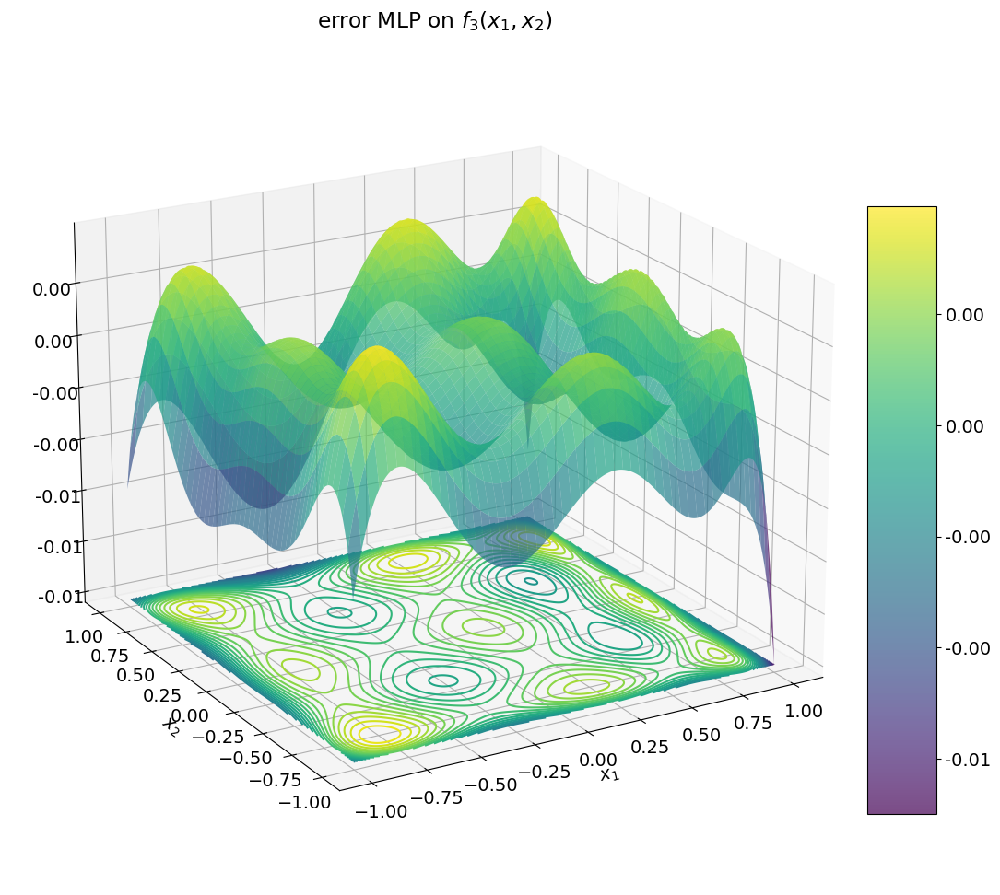

In [4]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='MLP on $f_3(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error MLP on $f_3(x_1, x_2)$')

-----
### KAN on $f_3$

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 180


description:   0%|                                                          | 0/100 [00:00<?, ?it/s]

| train_loss: 1.07e-03 | test_loss: 1.13e-03 | reg: 6.22e+00 | : 100%|█| 100/100 [02:56<00:00,  1.76


saving model version 0.1


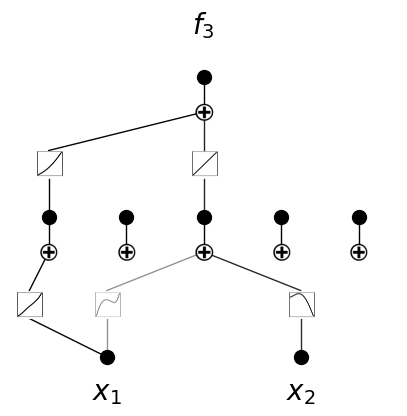

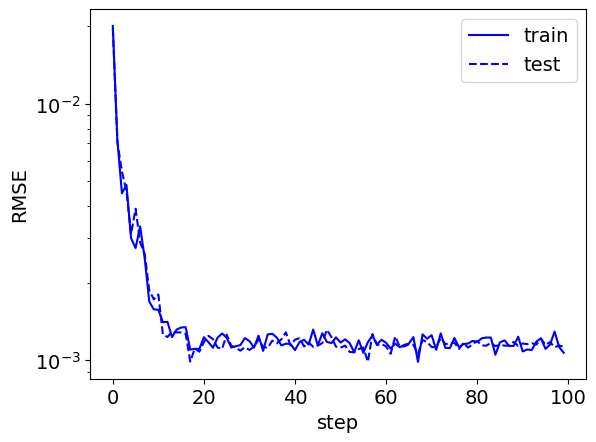

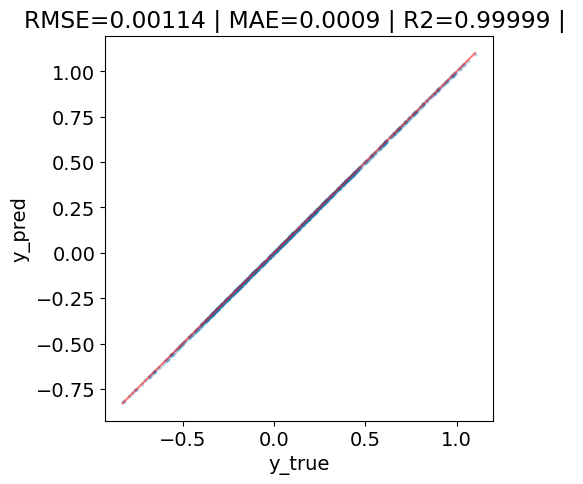

In [5]:
# initialize KAN with G=3
model = KAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=100, lamb=1e-4, update_grid=False, batch=250)
kan_summary_after_fit(model, dataset, results, in_vars = ['$x_1$', '$x_2$'], out_vars = ['$f_3$'])

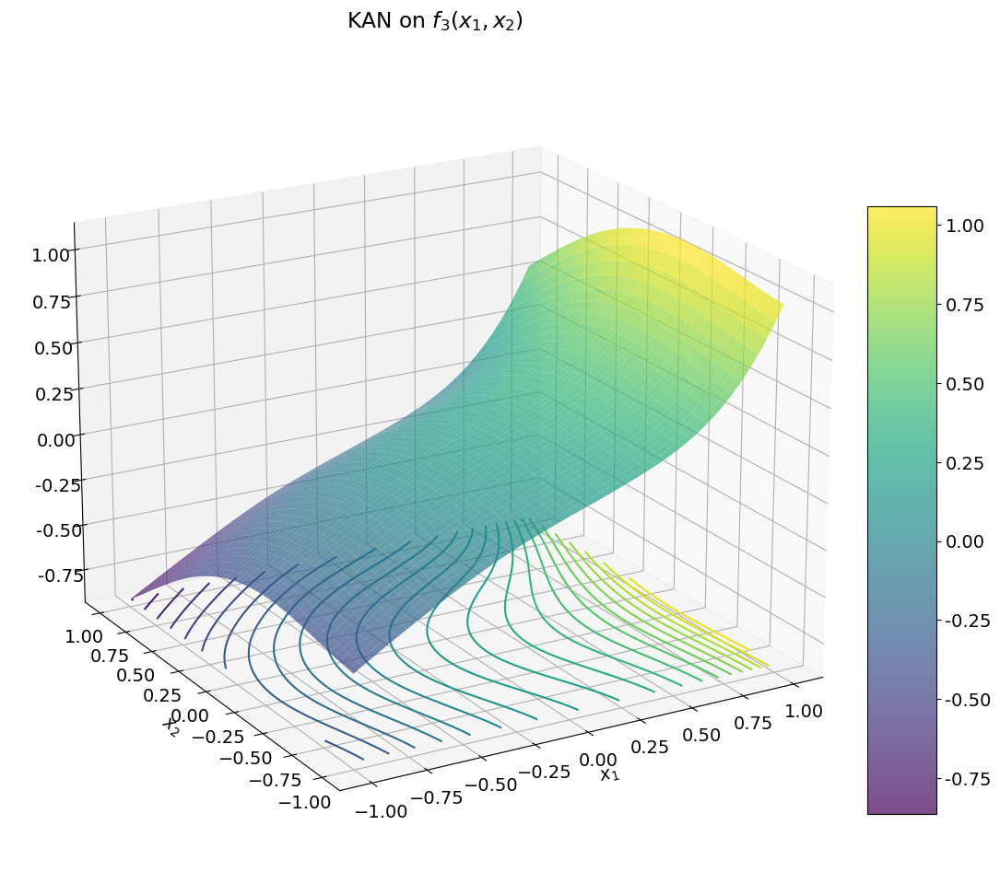

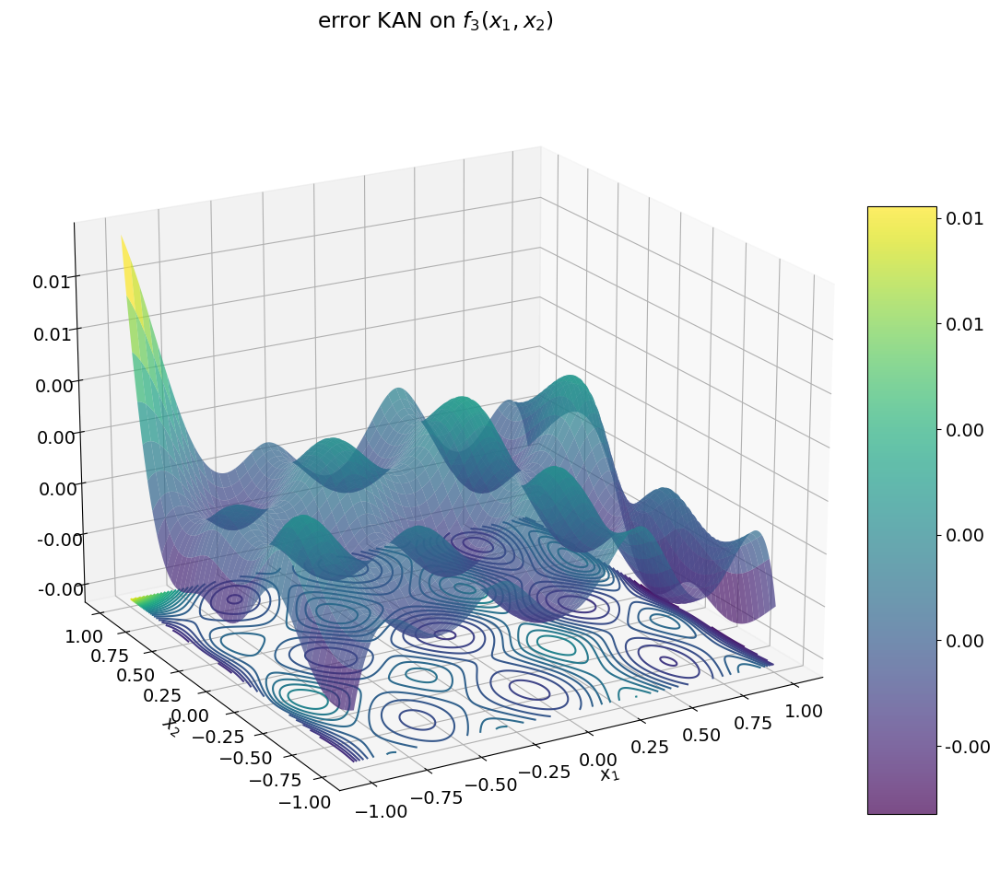

In [6]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='KAN on $f_3(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error KAN on $f_3(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_3$

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


| train_loss: 3.25e-02 | test_loss: 3.52e-02 | reg: 1.25e+01 | : 100%|█| 150/150 [04:23<00:00,  1.76


saving model version 0.1


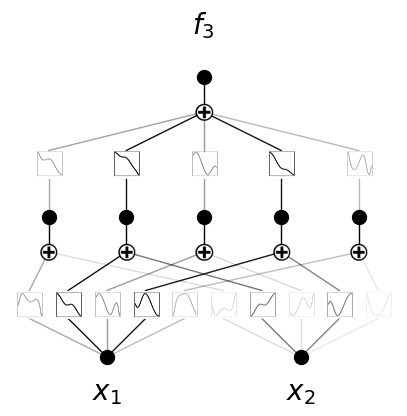

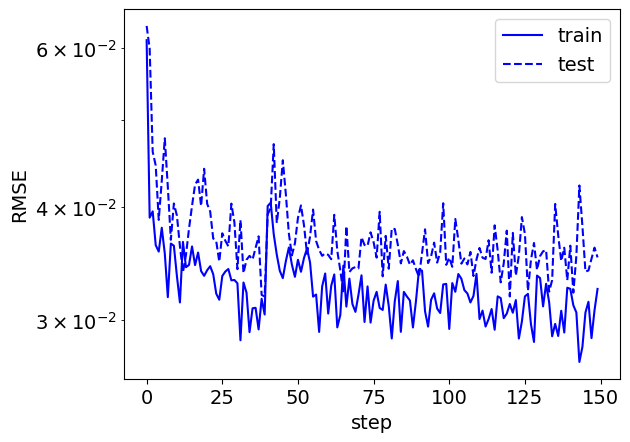

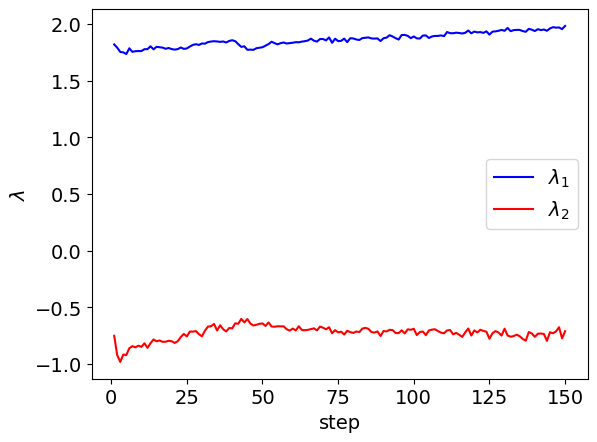

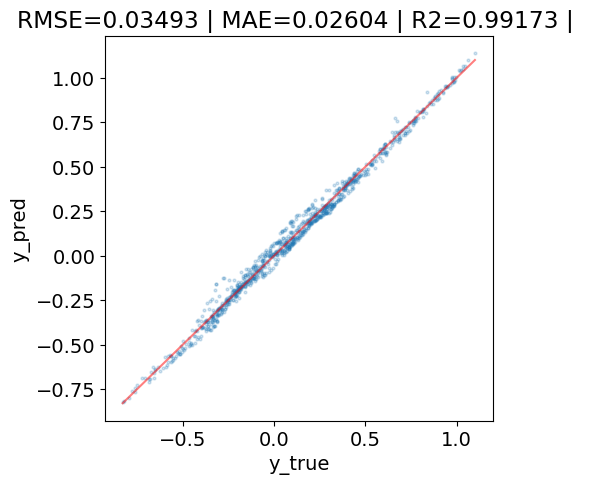

model.act_fun[0].lmd=Parameter containing:
tensor([ 1.9837, -0.7113], requires_grad=True)


In [7]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=0.0, reg_type='entropy',
                    batch=250)
kan_summary_after_fit(model, dataset, results, lmdKAN=True, in_vars = ['$x_1$', '$x_2$'], out_vars = ['$f_3$'])
print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:58, 17.01it/s]                          


module of Input importance:


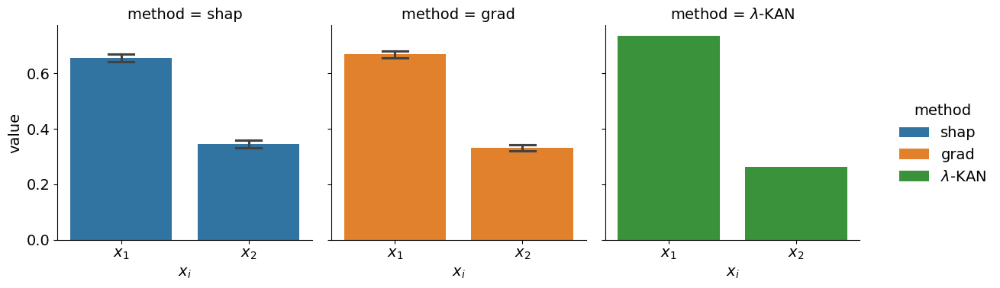

Input importance:


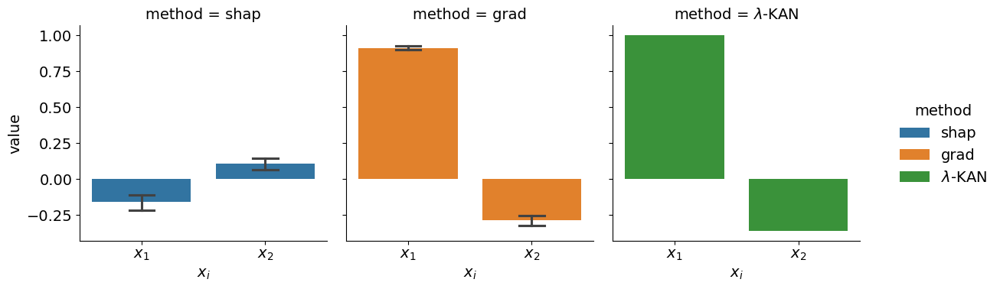

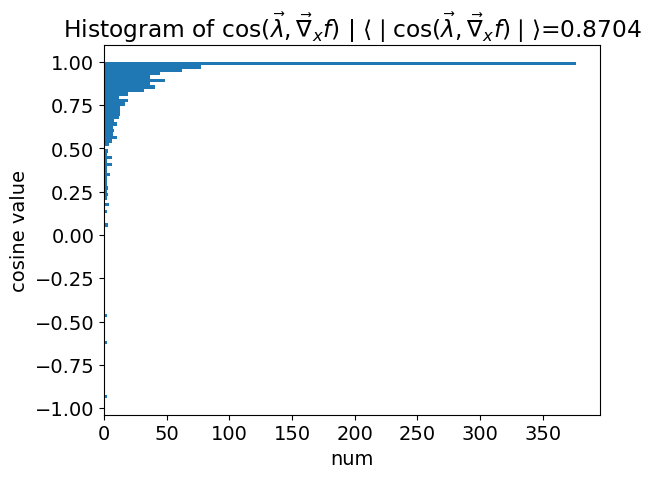

In [8]:
importance_analyse_lmdKAN(model, dataset)

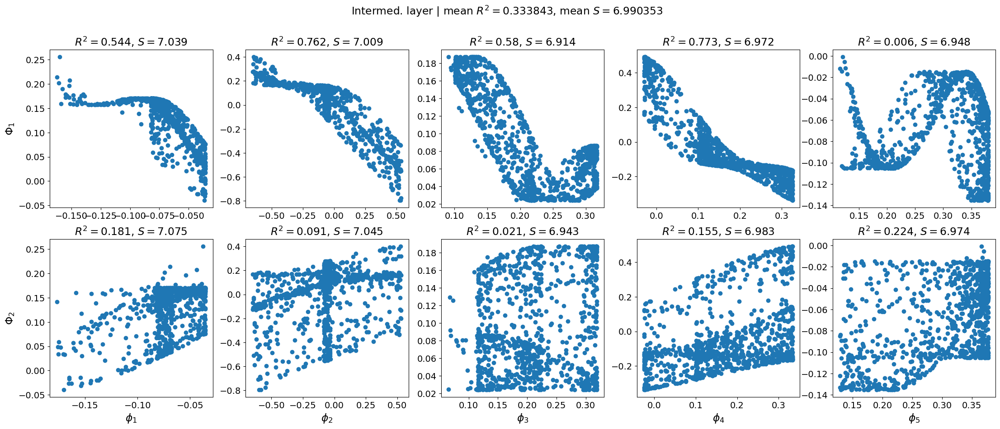

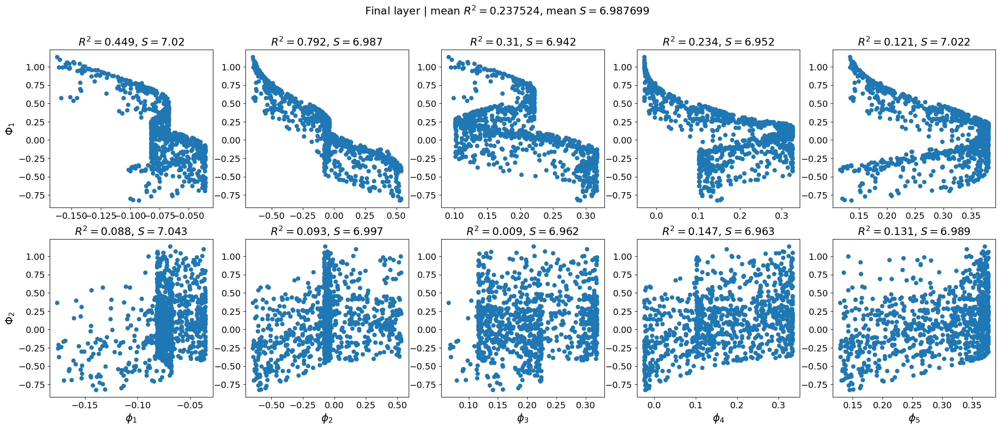

{'mean_r2': 0.23752414518967271, 'mean_matrix_entropy': 6.987699031829834}

In [9]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

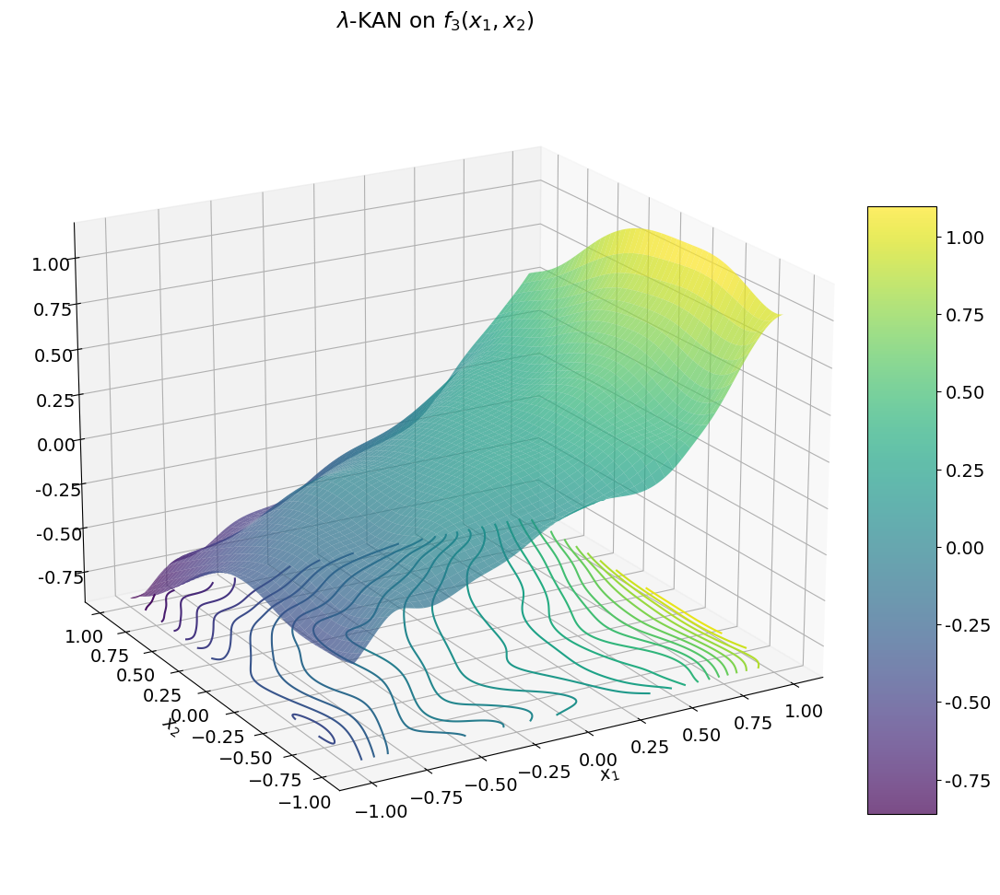

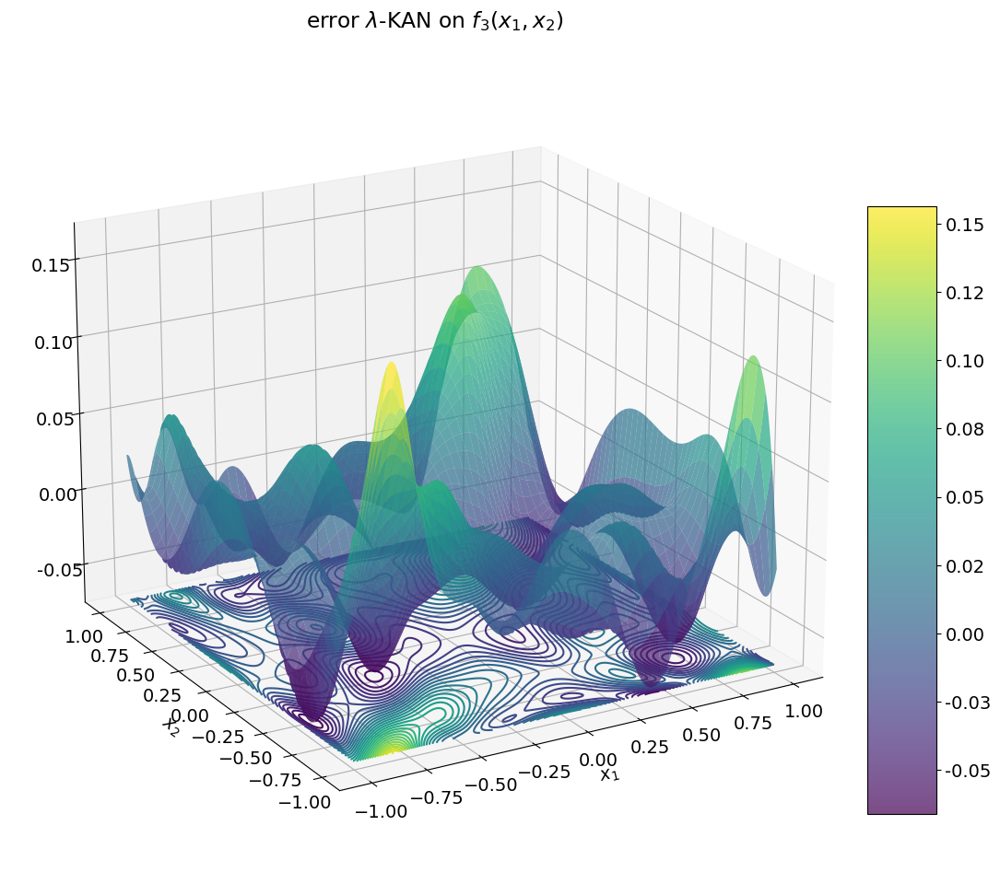

In [10]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_3(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_3(x_1, x_2)$')

-----
### trainable $\lambda$-KAN on $f_3$

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 286


| train_loss: 6.73e-03 | test_loss: 8.24e-03 | reg: 5.38e+00 | : 100%|█| 150/150 [16:03<00:00,  6.43


saving model version 0.1


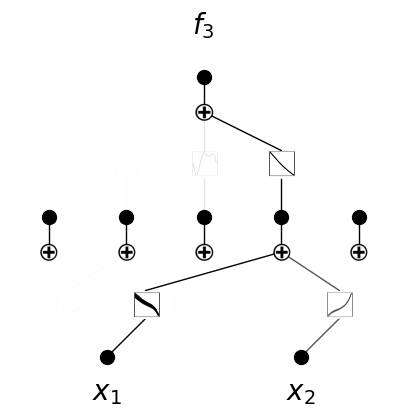

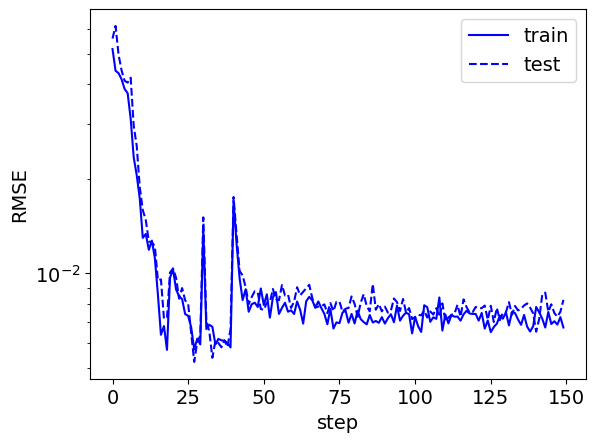

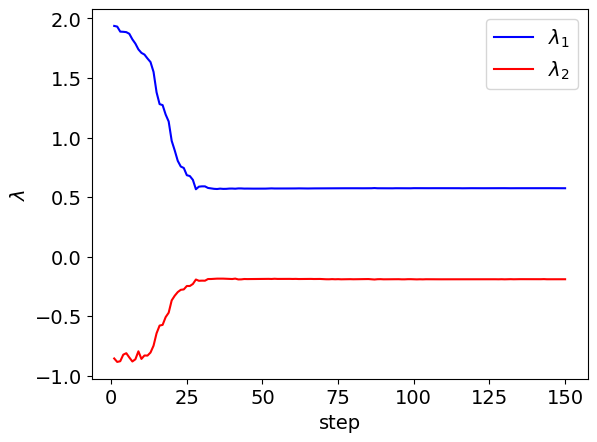

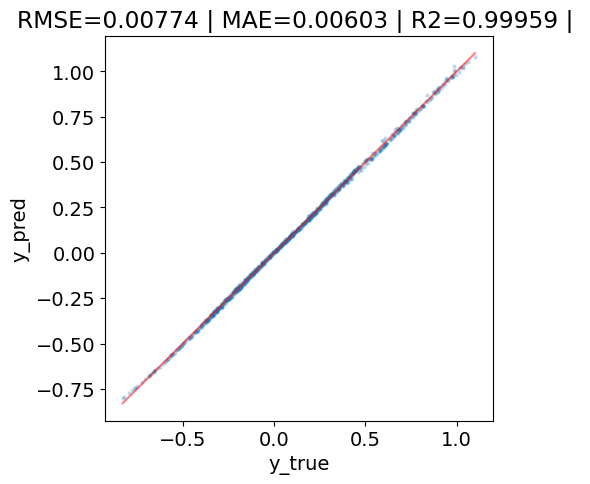

model.act_fun[0].lmd=Parameter containing:
tensor([ 0.5740, -0.1903], requires_grad=True)


In [11]:
# initialize lmdKAN with G=3
model = tlmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device, tlmd_type='kan', tlmd_width=[3], lmd_init_vector=[1,1], tlmd_alpha=1e-1)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=0.0, reg_type='entropy',
                    batch=250)
kan_summary_after_fit(model, dataset, results, lmdKAN=True, in_vars = ['$x_1$', '$x_2$'], out_vars = ['$f_3$'])
print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [02:29,  6.24it/s]                          


module of Input importance:


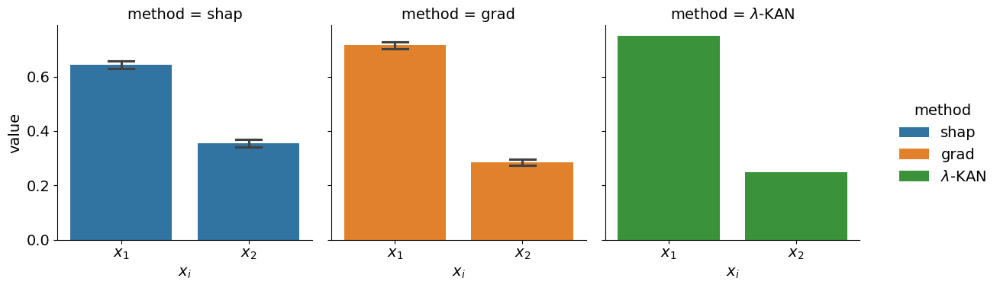

Input importance:


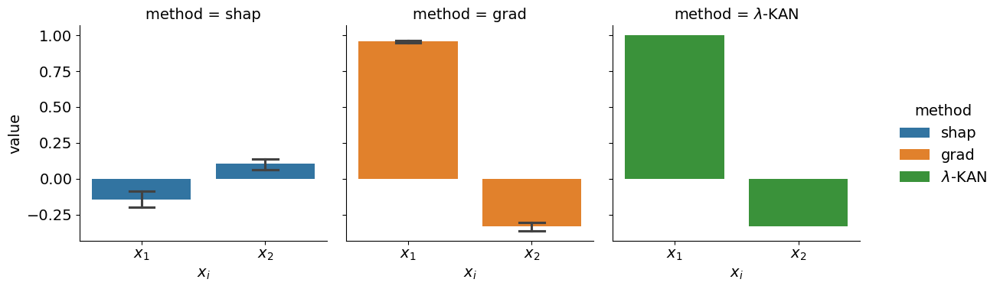

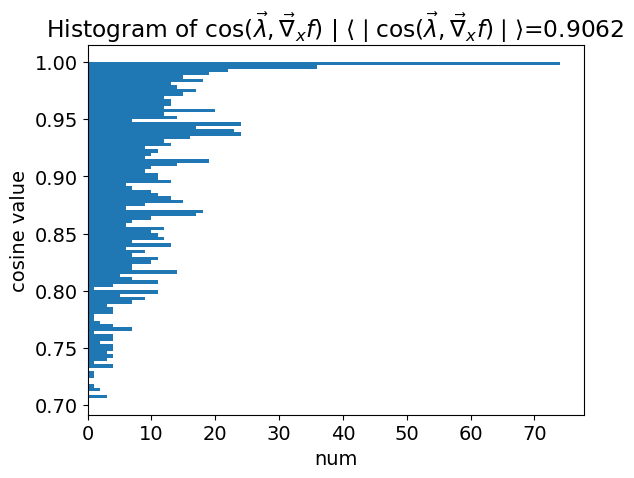

In [12]:
importance_analyse_lmdKAN(model, dataset)

ExactExplainer explainer: 1001it [02:48,  5.64it/s]                          


module of Input importance:


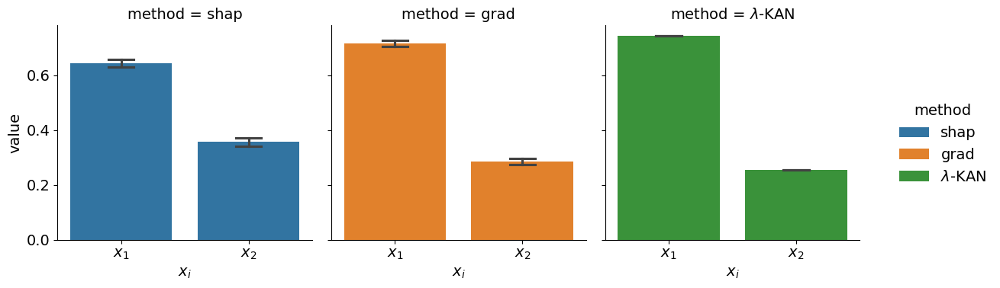

Input importance:


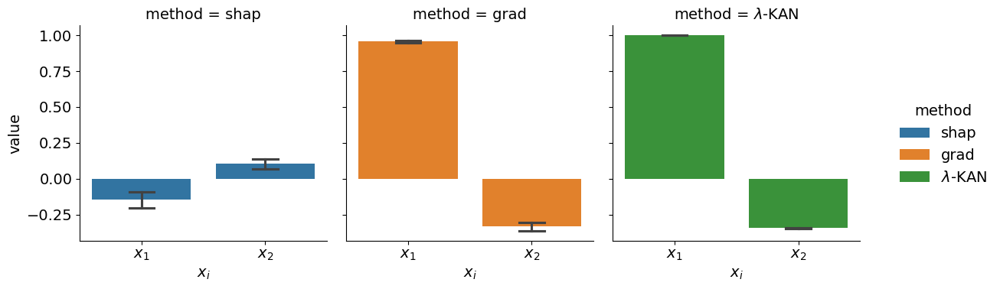

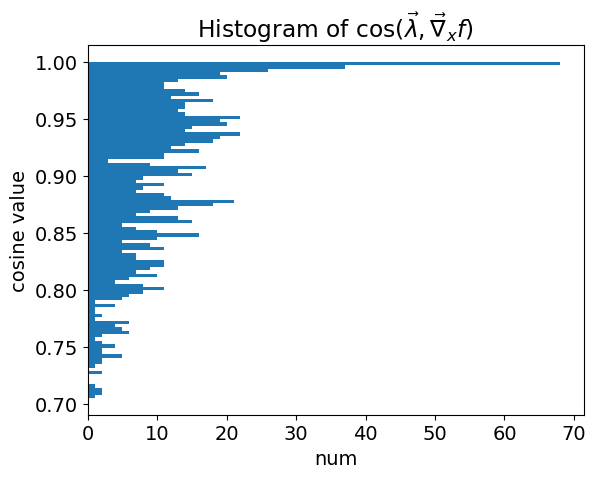

In [13]:
importance_analyse_tlmdKAN(model, dataset)

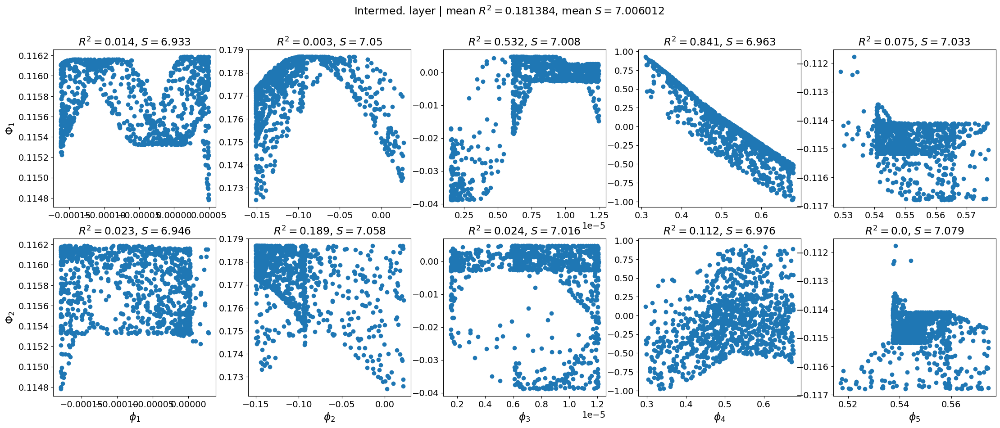

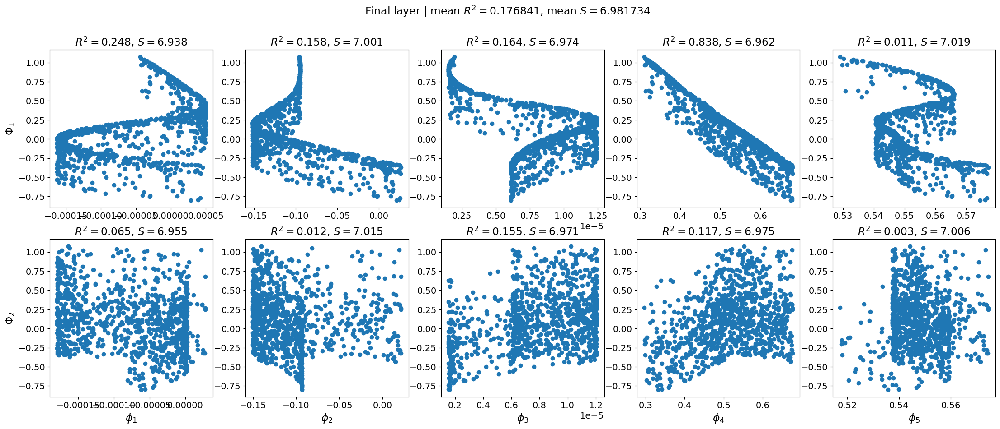

{'mean_r2': 0.17684086479712277, 'mean_matrix_entropy': 6.981734275817871}

In [14]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

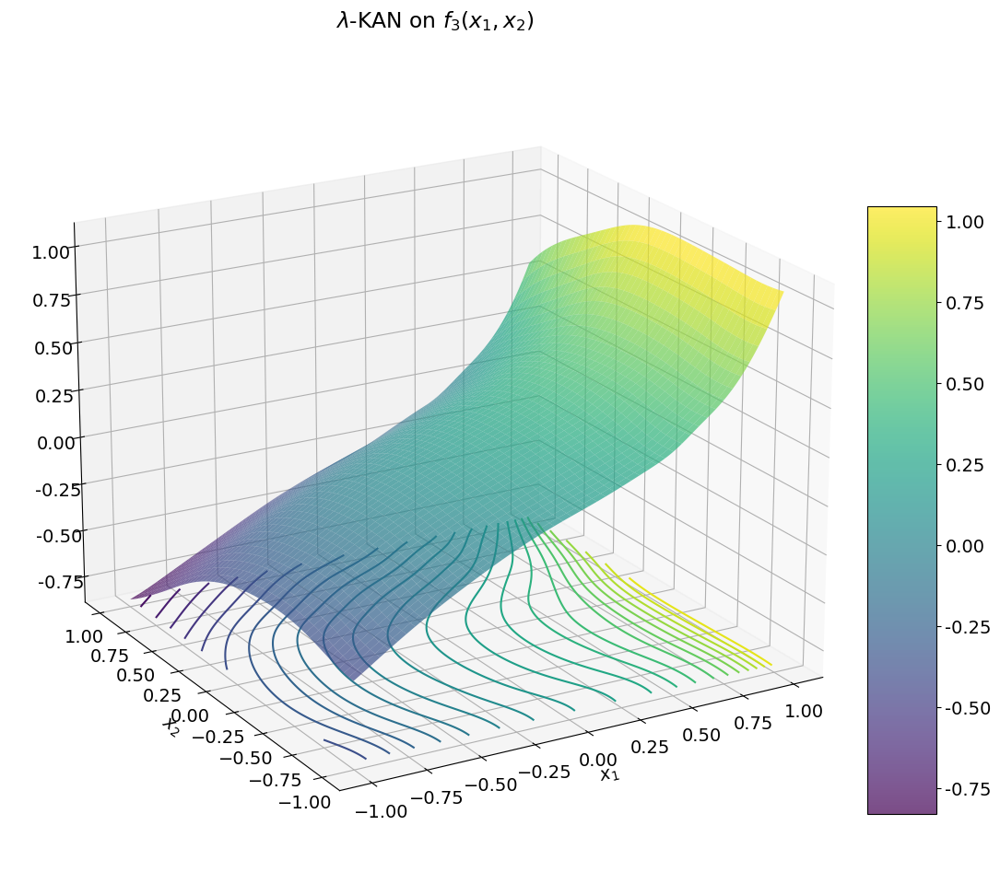

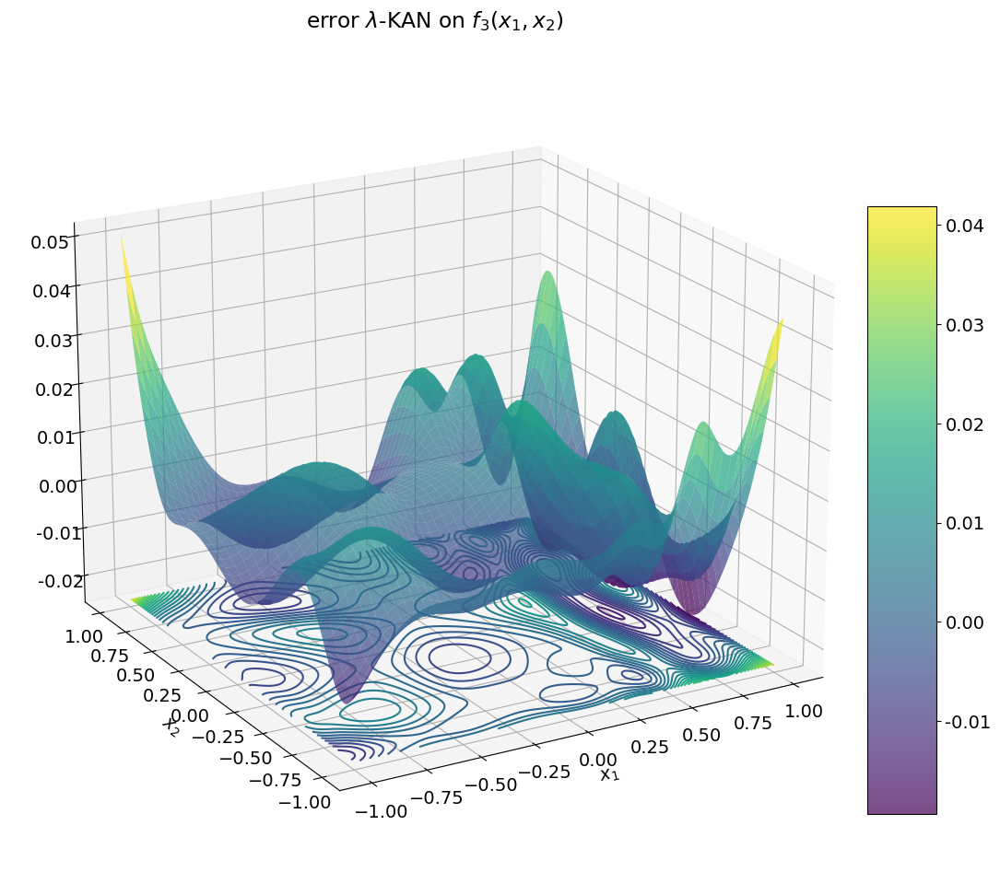

In [15]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_3(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_3(x_1, x_2)$')

## _Bellow presented code, which was not used in main experiments._

-----
-----
### $\lambda$-KAN on $f_3$ with __R2 regression__ in respect to __Interm. activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


description:   0%|                                                          | 0/150 [00:00<?, ?it/s]

| train_loss: 3.20e-02 | test_loss: 3.45e-02 | reg: 7.43e+00 | : 100%|█| 150/150 [02:24<00:00,  1.04


saving model version 0.1


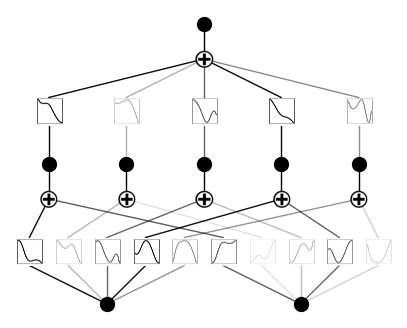

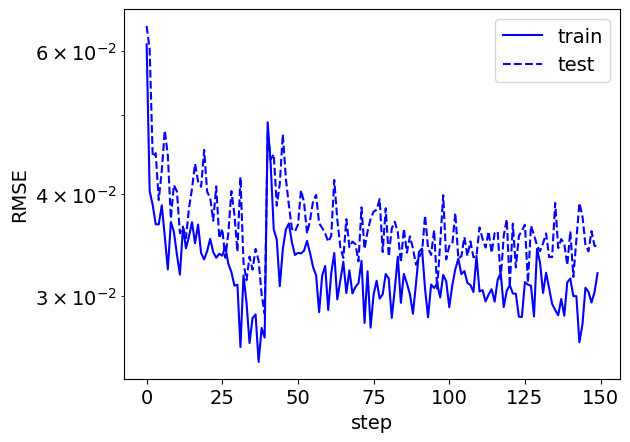

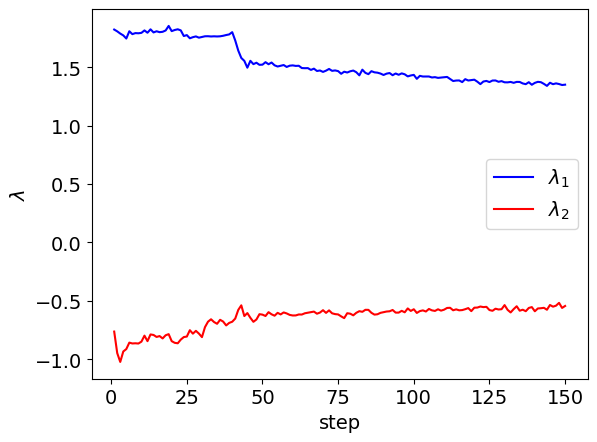

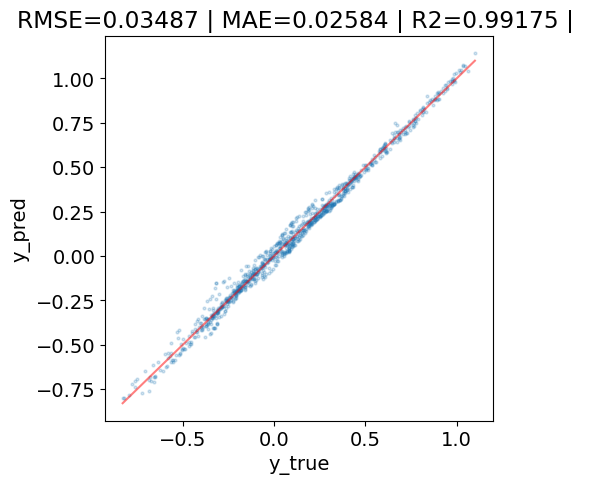

model.act_fun[0].lmd=Parameter containing:
tensor([ 1.3509, -0.5434], requires_grad=True)


In [ ]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=1.0, lamb_lmd_final=0.0, reg_type='r2',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:28, 21.78it/s]                         


module of Input importance:


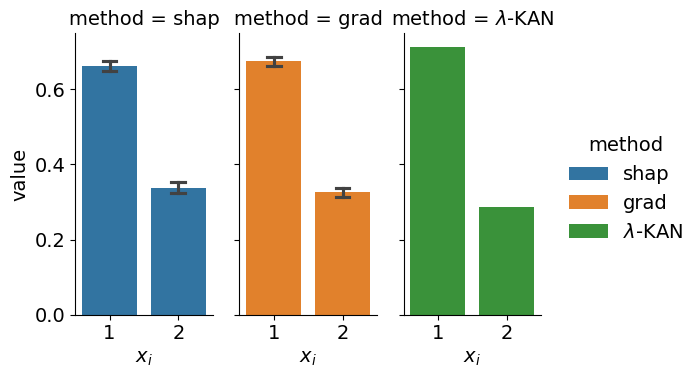

Input importance:


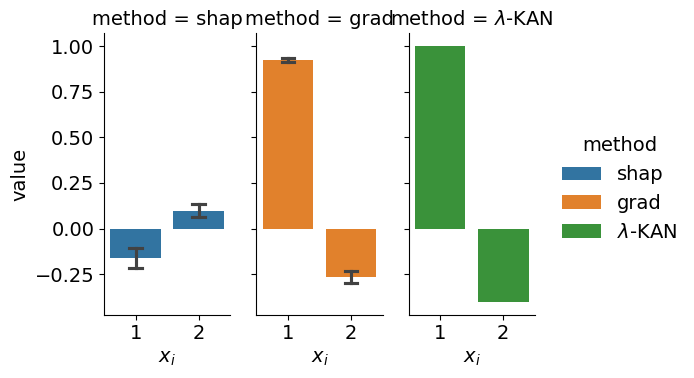

In [ ]:
importance_analyse_lmdKAN(model, dataset)

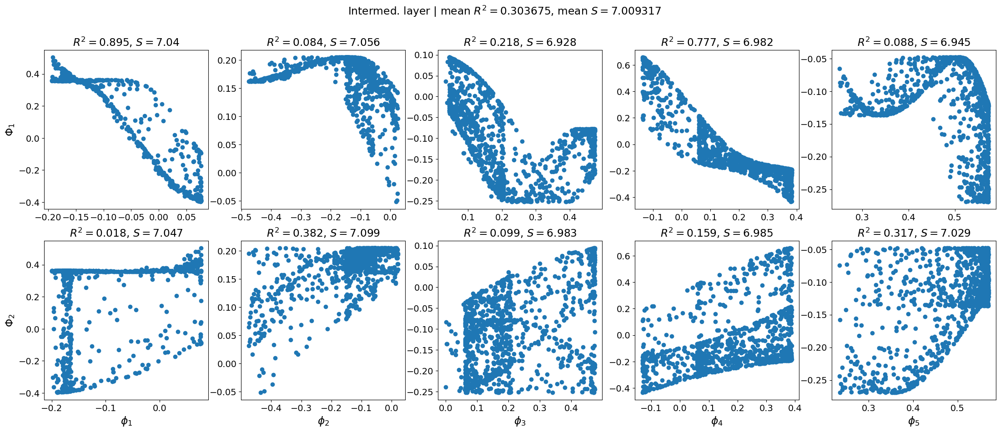

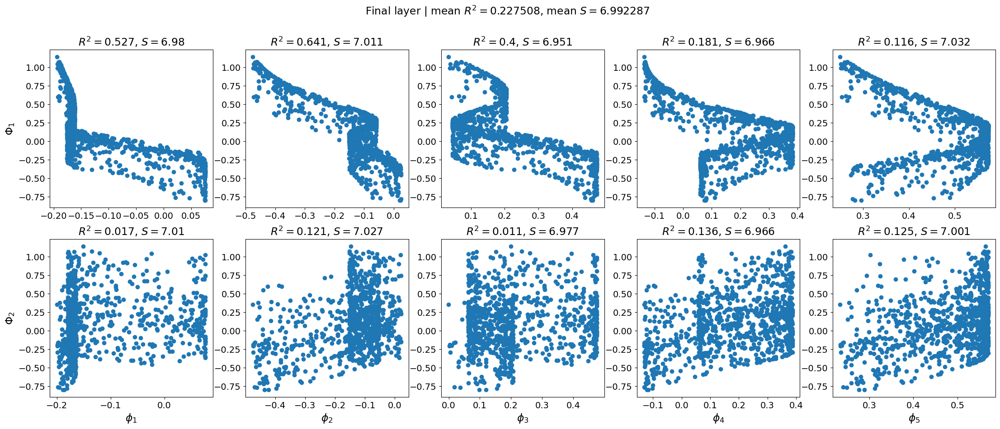

{'mean_r2': 0.22750781942158937, 'mean_matrix_entropy': 6.992286682128906}

In [ ]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

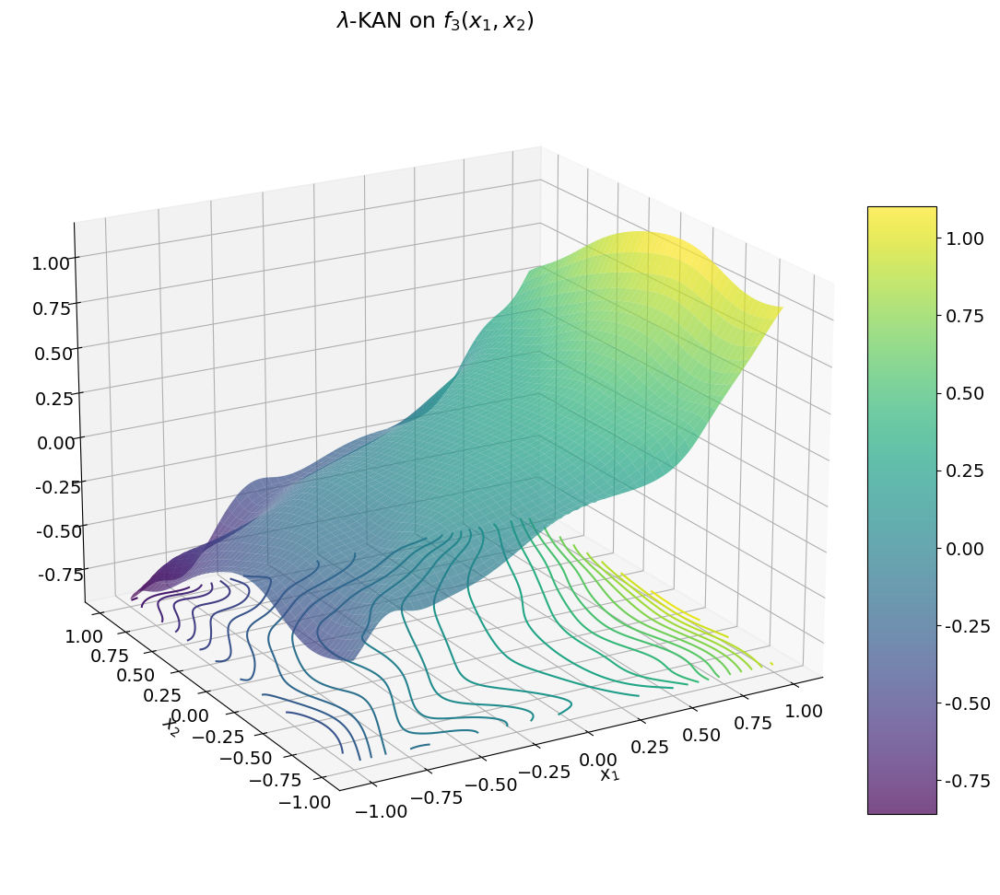

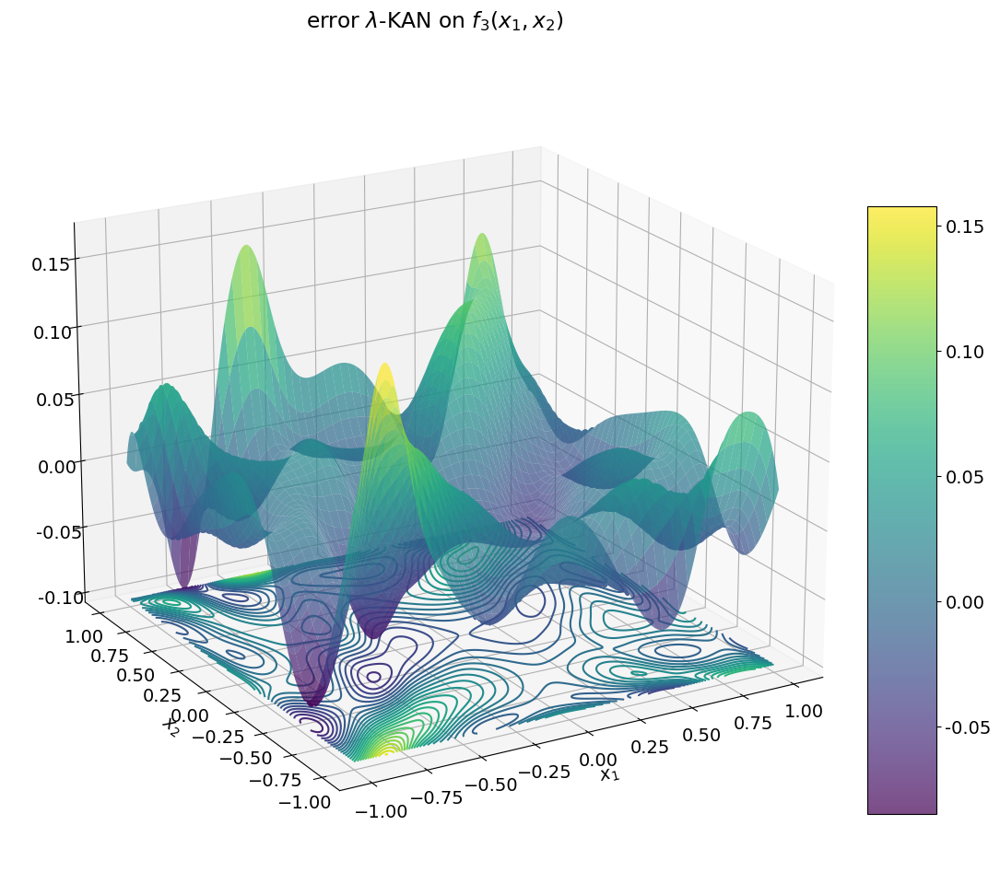

In [ ]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_3(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_3(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_3$ with __Entropy regression__ in respect to __Interm. activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


description:   0%|                                                          | 0/150 [00:00<?, ?it/s]

| train_loss: 3.21e-02 | test_loss: 3.32e-02 | reg: 7.67e+00 | : 100%|█| 150/150 [02:30<00:00,  1.01


saving model version 0.1


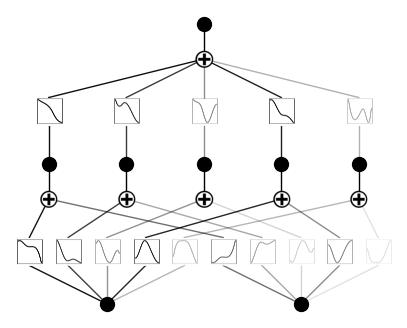

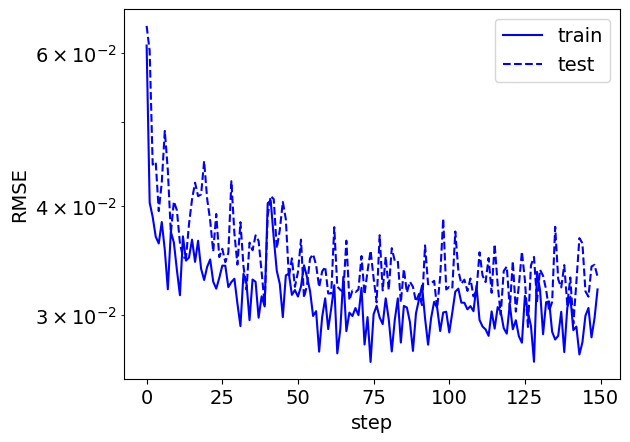

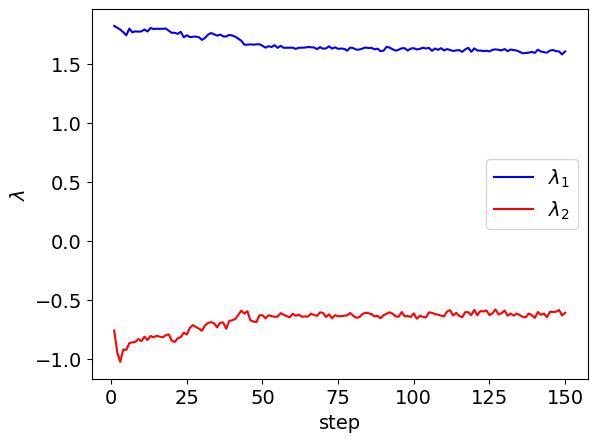

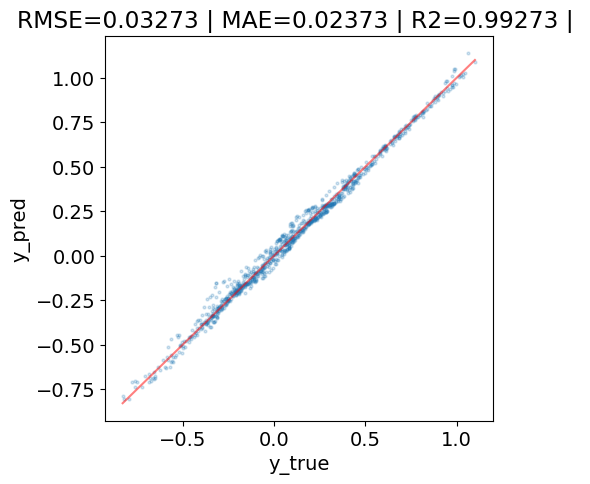

model.act_fun[0].lmd=Parameter containing:
tensor([ 1.6066, -0.6115], requires_grad=True)


In [ ]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=1.0, lamb_lmd_final=0.0, reg_type='entropy',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:20, 24.89it/s]                         


module of Input importance:


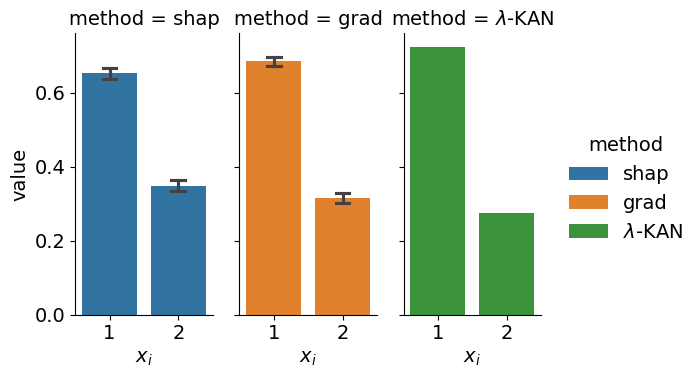

Input importance:


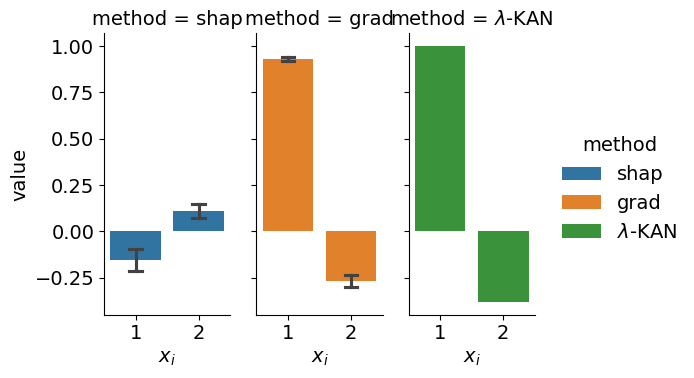

In [ ]:
importance_analyse_lmdKAN(model, dataset)

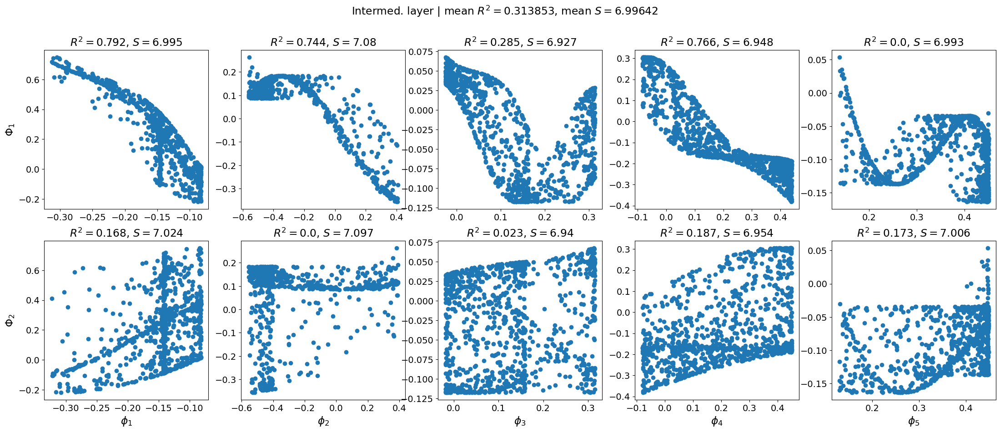

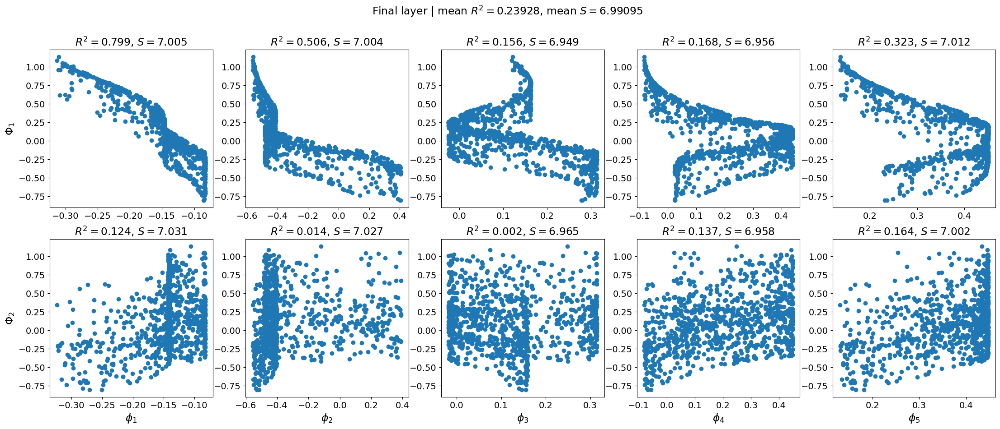

{'mean_r2': 0.23927995741833002, 'mean_matrix_entropy': 6.990950107574463}

In [ ]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

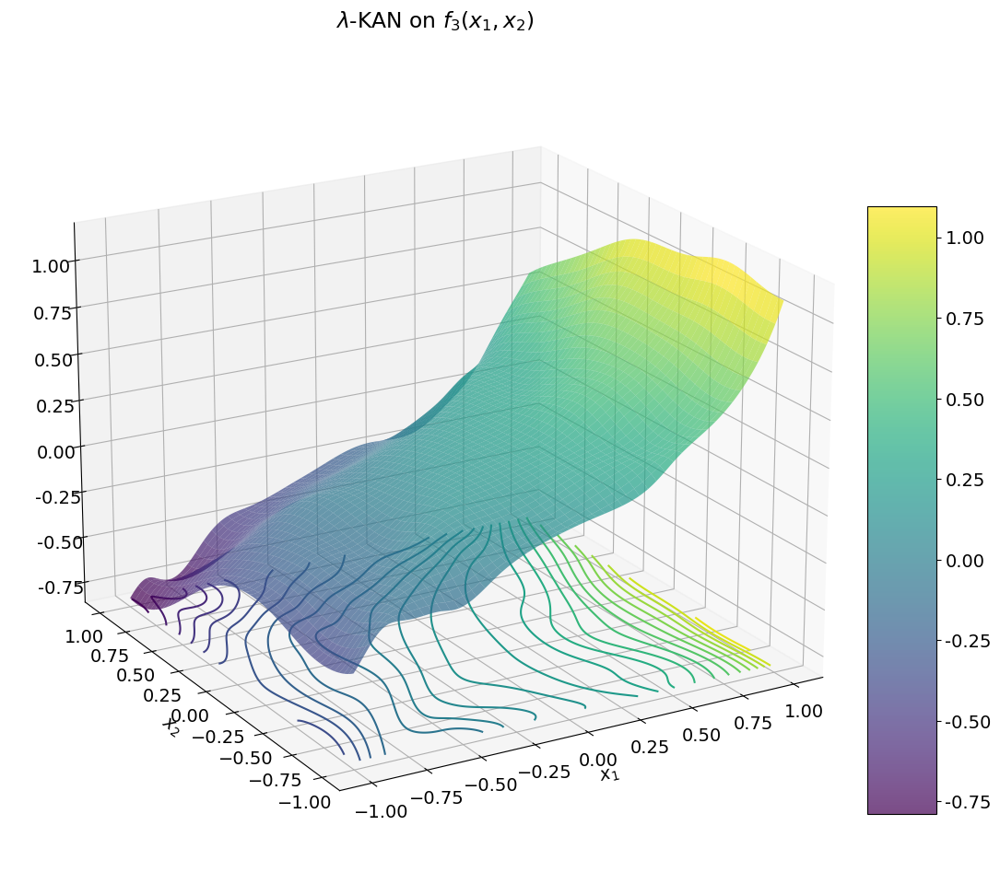

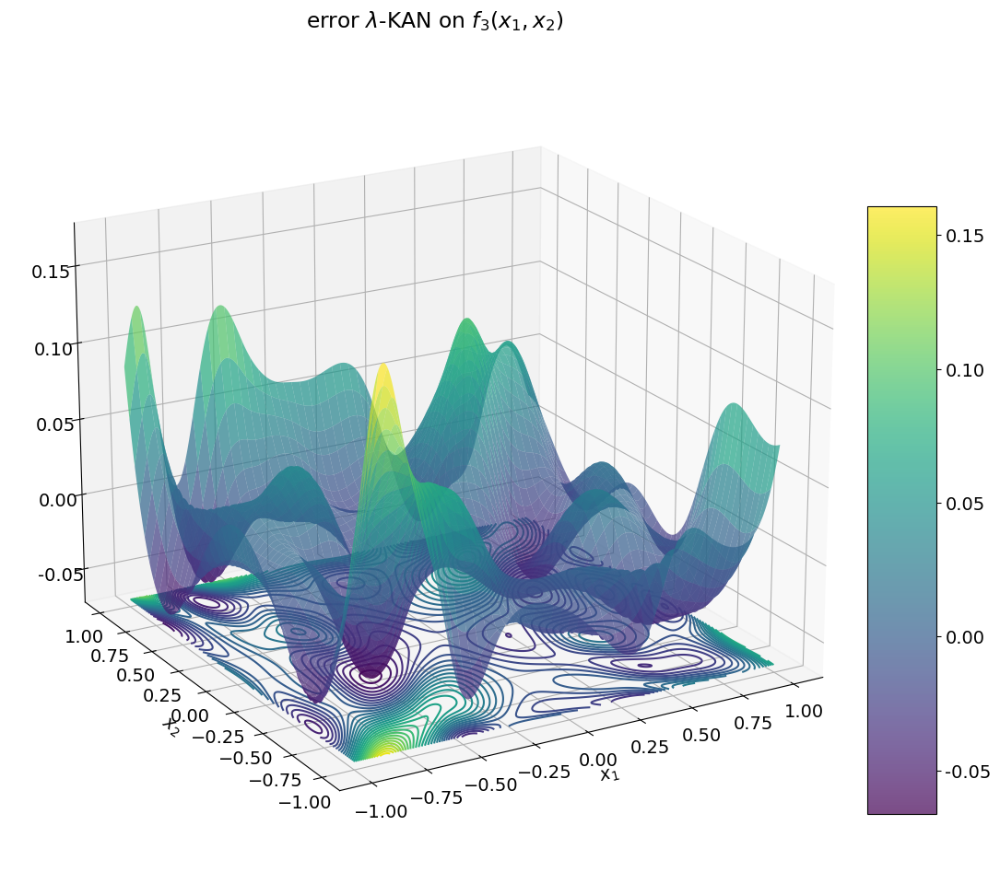

In [ ]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_3(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_3(x_1, x_2)$')

-----
-----
### $\lambda$-KAN on $f_3$ with __R2 regression__ in respect to __Final activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


| train_loss: 3.20e-02 | test_loss: 3.41e-02 | reg: 7.28e+00 | : 100%|█| 150/150 [01:23<00:00,  1.81


saving model version 0.1


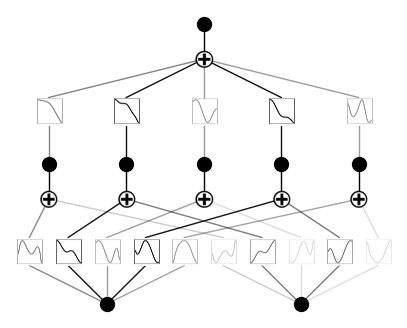

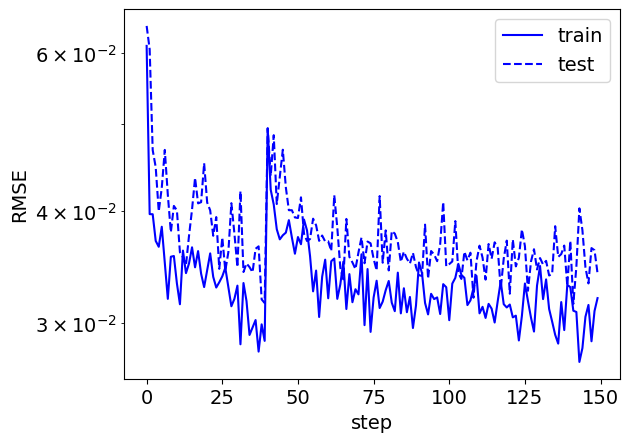

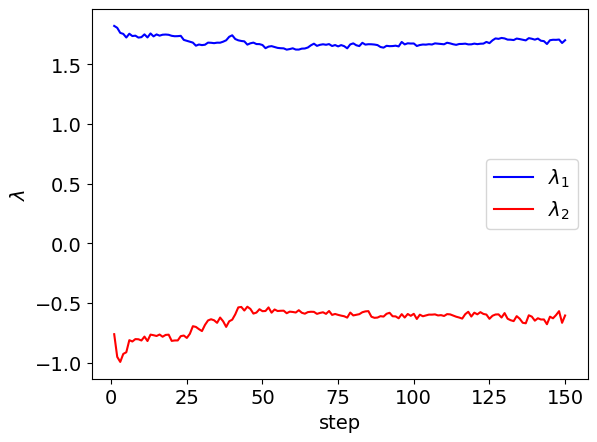

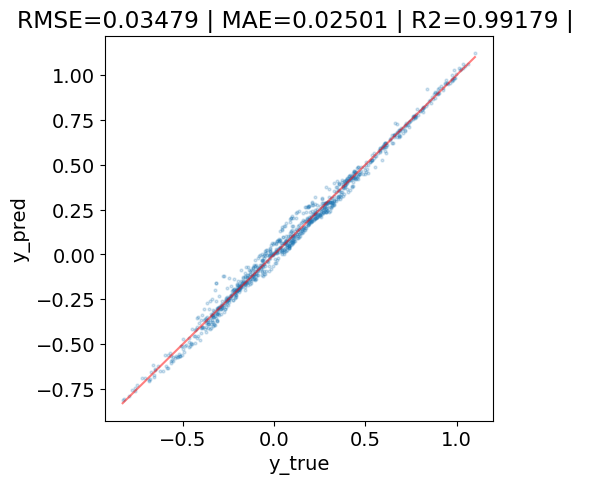

model.act_fun[0].lmd=Parameter containing:
tensor([ 1.7028, -0.6051], requires_grad=True)


In [ ]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=1.0, reg_type='r2',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:14, 22.68it/s]                         


module of Input importance:


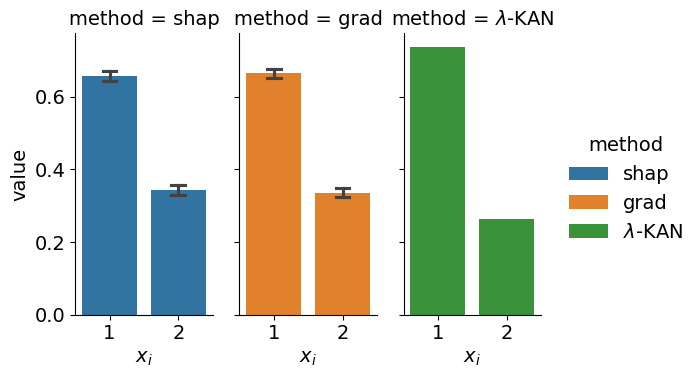

Input importance:


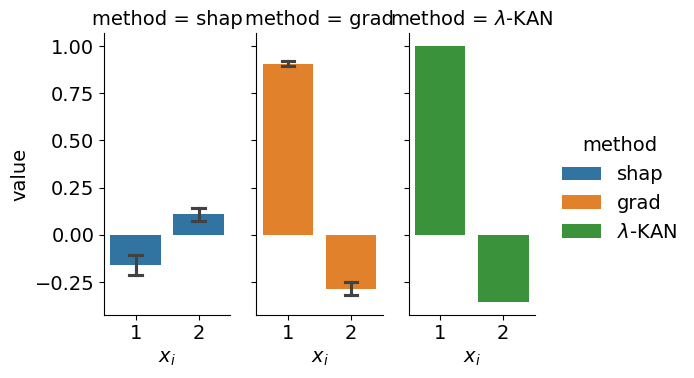

In [ ]:
importance_analyse_lmdKAN(model, dataset)

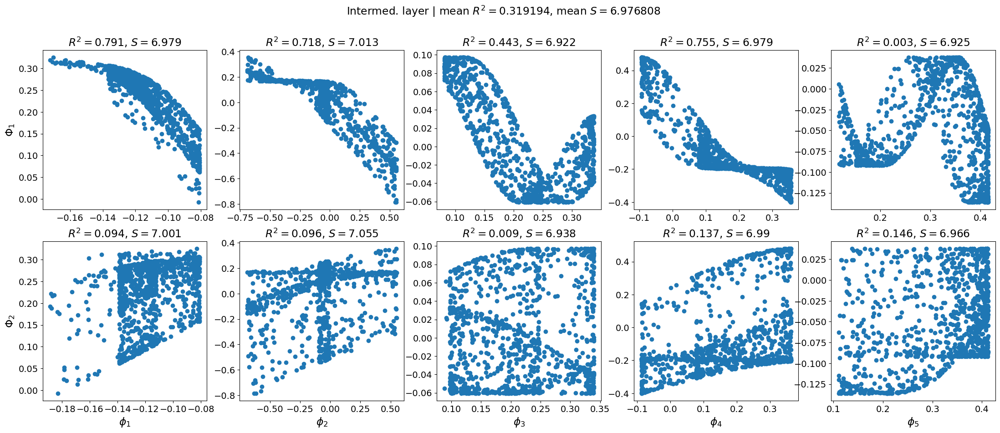

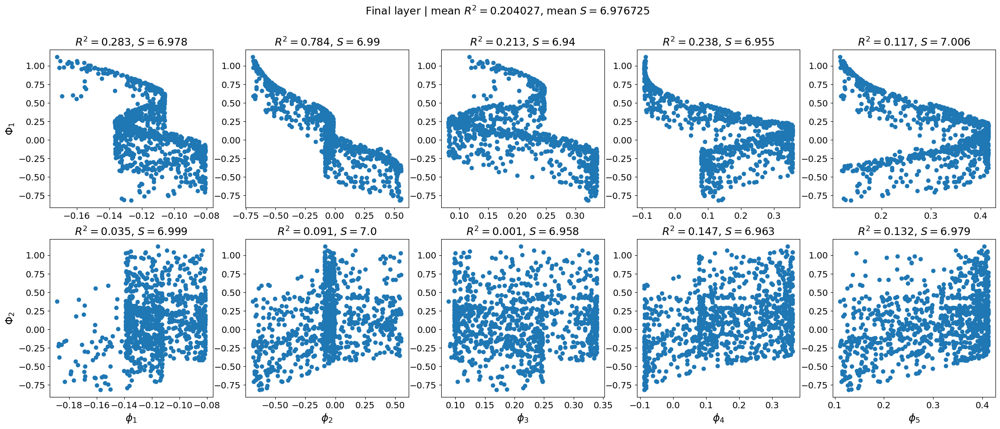

{'mean_r2': 0.20402672272757627, 'mean_matrix_entropy': 6.976725101470947}

In [ ]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

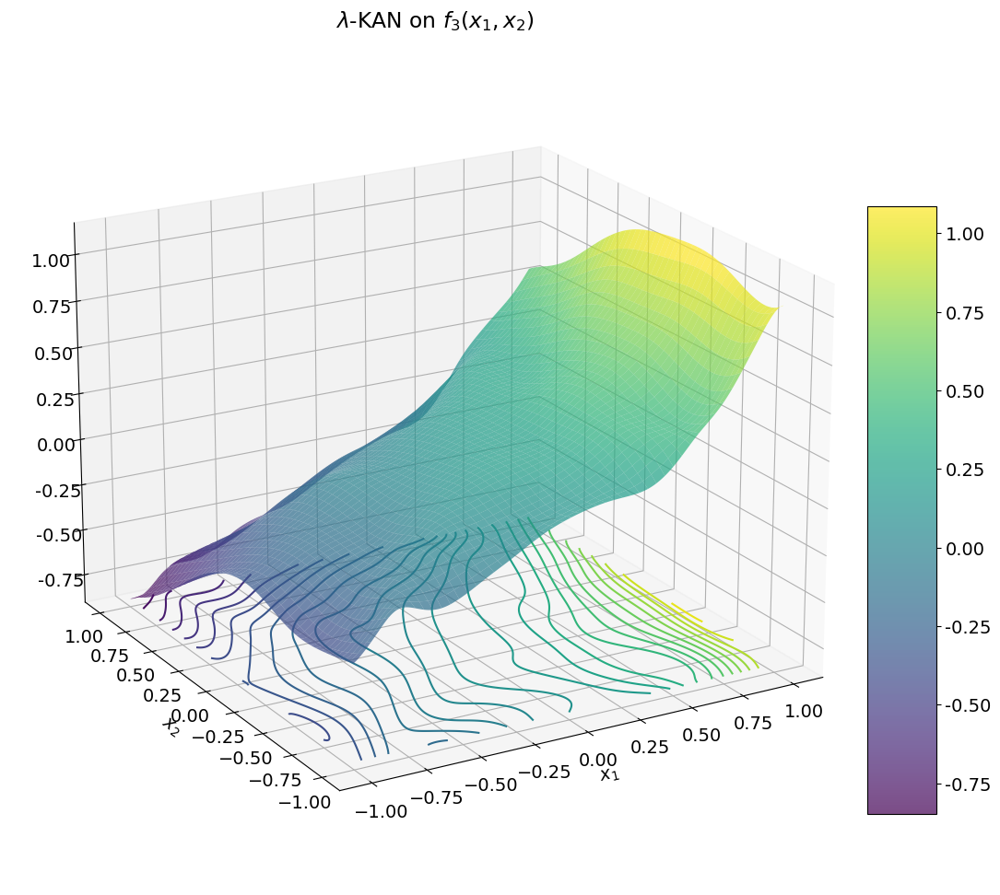

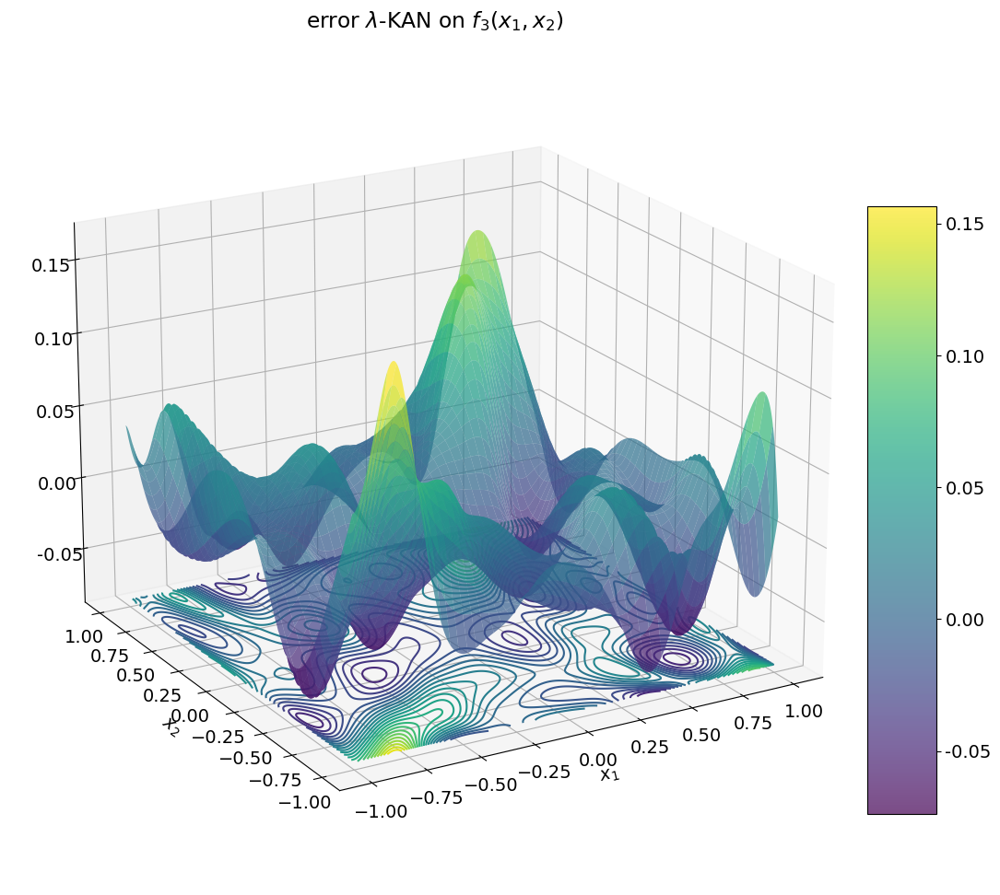

In [ ]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_3(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_3(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_3$ with __Entropy regression__ in respect to __Final activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


description:   0%|                                                          | 0/150 [00:00<?, ?it/s]

| train_loss: 2.41e-02 | test_loss: 2.62e-02 | reg: 6.76e+00 | : 100%|█| 150/150 [01:50<00:00,  1.36


saving model version 0.1


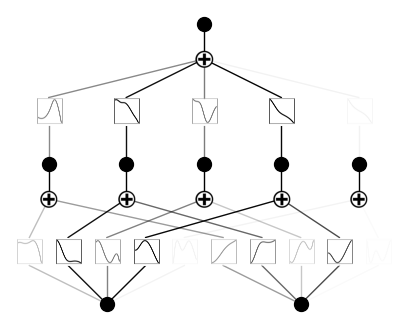

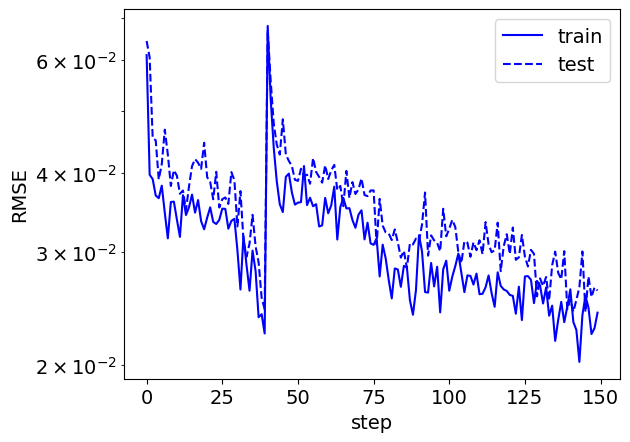

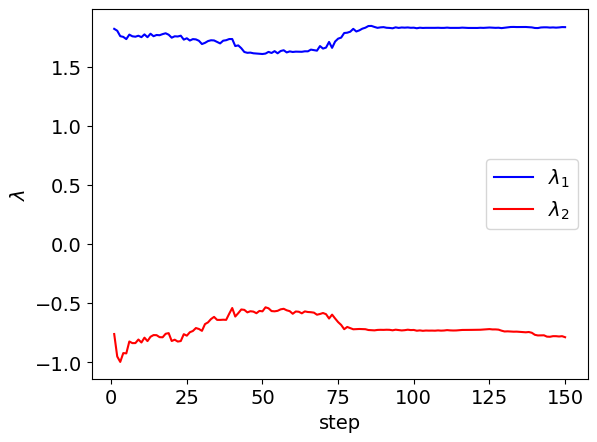

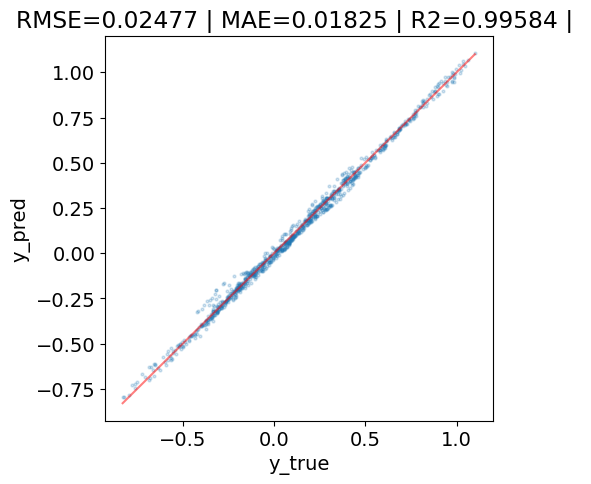

model.act_fun[0].lmd=Parameter containing:
tensor([ 1.8371, -0.7889], requires_grad=True)


In [ ]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=1.0, reg_type='entropy',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:17, 27.37it/s]                         


module of Input importance:


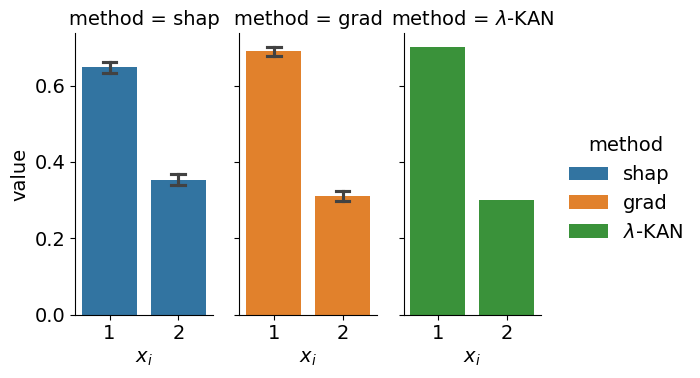

Input importance:


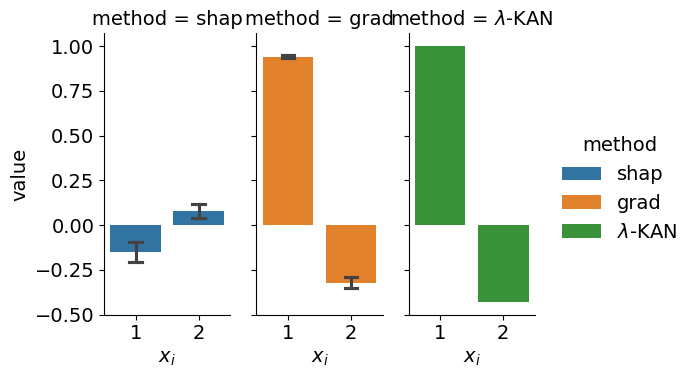

In [ ]:
importance_analyse_lmdKAN(model, dataset)

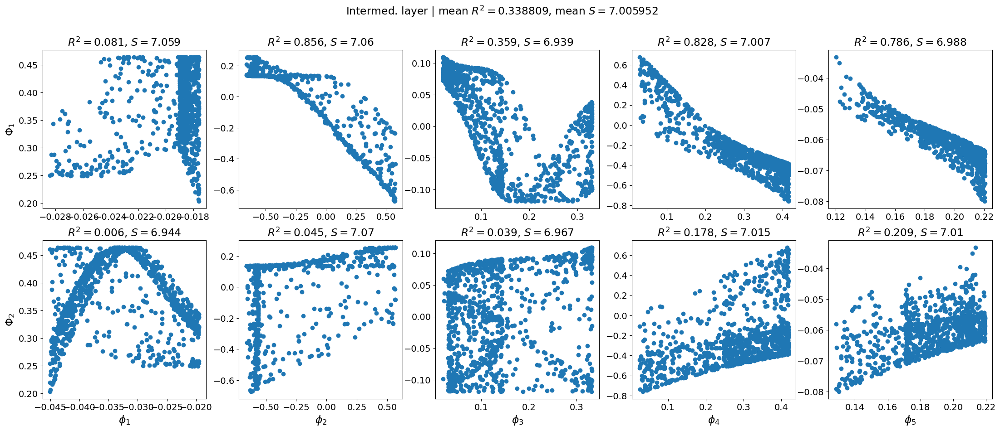

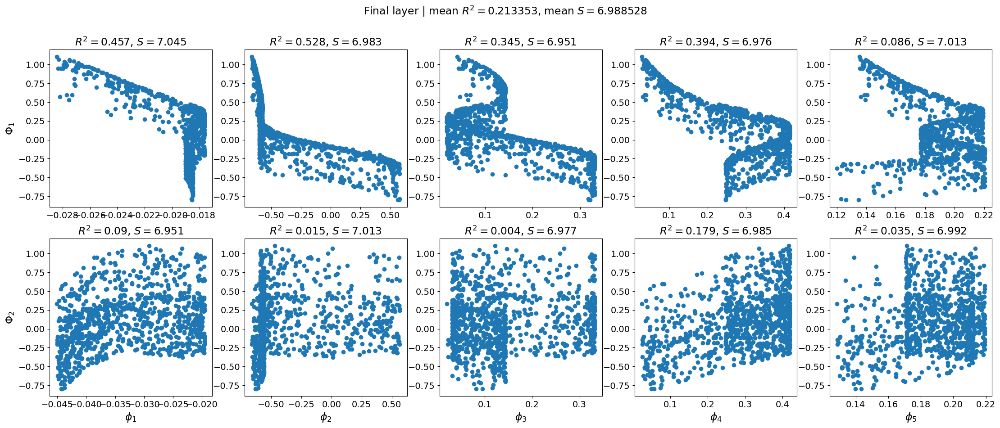

{'mean_r2': 0.21335328000131995, 'mean_matrix_entropy': 6.988528251647949}

In [ ]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

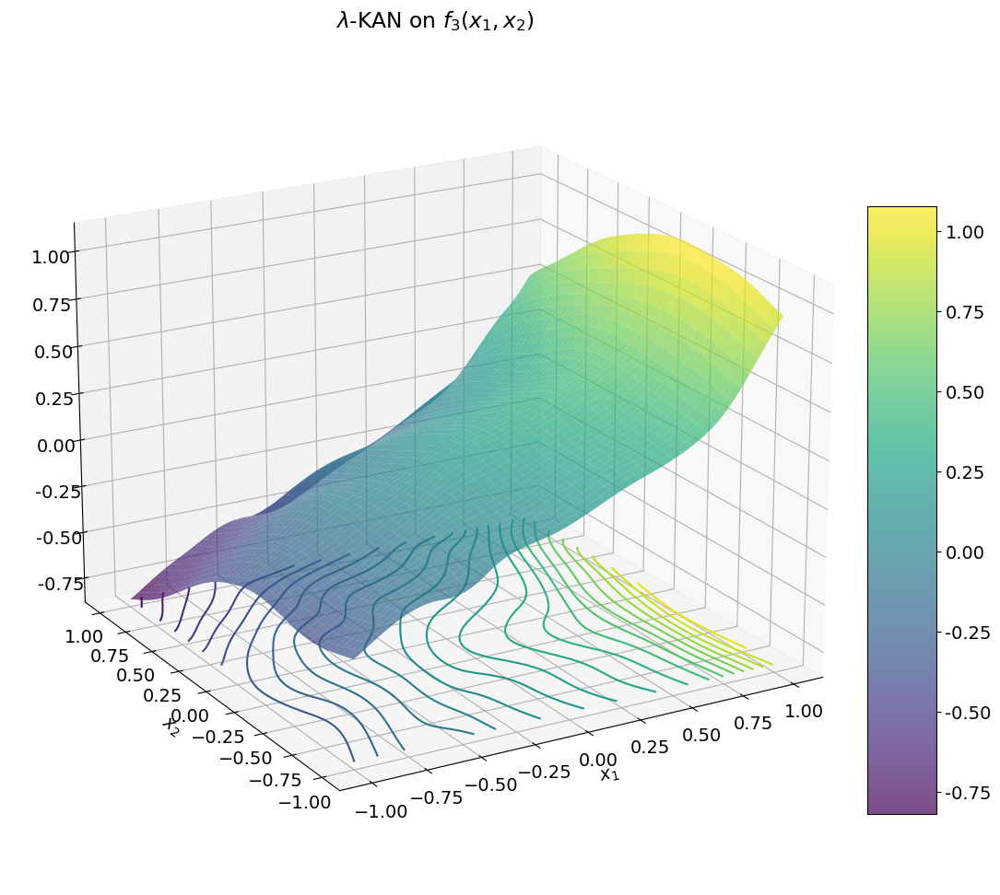

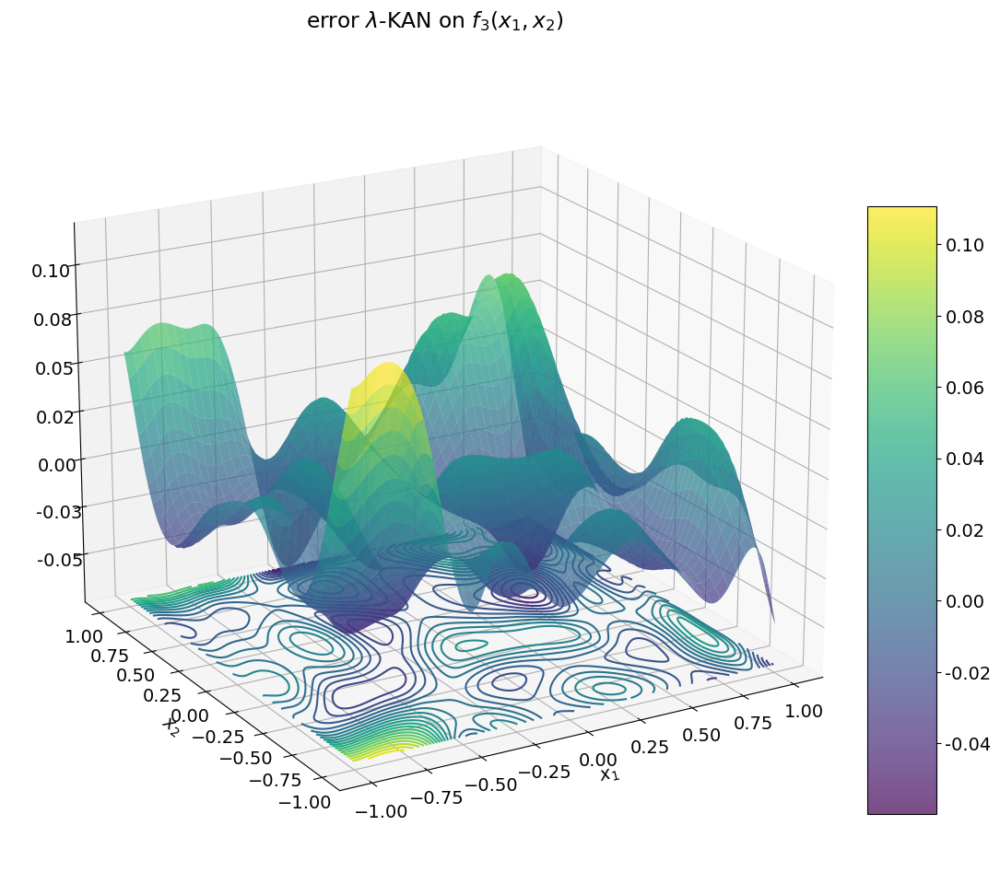

In [ ]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_3(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_3(x_1, x_2)$')